# Predict and Analysis Default Loan on Lending CLub Dataset

In [4]:
# Import Packages/Library

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.base import clone
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold, cross_val_score, RandomizedSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc


from boruta import BorutaPy
from imblearn.over_sampling import RandomOverSampler, SMOTE

import warnings
warnings.filterwarnings('ignore')

### Get Dataset

In [5]:
# Get Dataset
df_loan = pd.read_csv(r'D:\Project_Data\Loan CLub Loan Data\loan.csv')
description = pd.read_excel(r"D:\Project_Data\Loan CLub Loan Data\LCDataDictionary.xlsx").dropna()
df_loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,NaN,NaN,2500,2500,2500.0,36 months,13.56,84.92,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,30000,30000,30000.0,60 months,18.94,777.23,D,D2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,5000,5000,5000.0,36 months,17.97,180.69,D,D1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,4000,4000,4000.0,36 months,18.94,146.51,D,D2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,30000,30000,30000.0,60 months,16.14,731.78,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


### Describe Data

In [10]:
# Check the description for each columns
description.style.set_properties(subset=['Description'], **{'widht': '1000px'})

,LoanStatNew,Description
0,acc_now_delinq,The number of accounts on which the borrower is now delinquent.
1,acc_open_past_24mths,Number of trades opened in past 24 months.
2,addr_state,The state provided by the borrower in the loan application
3,all_util,Balance to credit limit on all trades
4,annual_inc,The self-reported annual income provided by the borrower during registration.
5,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
6,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
7,avg_cur_bal,Average current balance of all accounts
8,bc_open_to_buy,Total open to buy on revolving bankcards.
9,bc_util,Ratio of total current balance to high credit/credit limit for all bankcard accounts.


In [11]:
# Define a function to generate a summary dataframe of data characteristics
def summary(data):
    summary = pd.DataFrame({
        'feature': data.columns.values,
        'data_type': data.dtypes.values,
        'null_values(%)': data.isna().mean().values * 100,
        'neg_values(%)': [len(data[col][data[col] < 0]) / len(data) * 100 if col in data.select_dtypes(include=[np.number]).columns else 0 for col in data.columns],
        '0_values(%)': [len(data[col][data[col] == 0]) / len(data) * 100 if col in data.select_dtypes(include=[np.number]).columns else 0 for col in data.columns],
        'duplicate': data.duplicated().sum(),
        'n_unique': data.nunique().values,
        'sample_unique': [data[col].unique() for col in data.columns]
    })
    
    return summary.round(3)

In [12]:
# Summary df loan variable
summary_df_loan = summary(df_loan)
summary_df_loan.iloc[:60, :]

,feature,data_type,null_values(%),neg_values(%),0_values(%),duplicate,n_unique,sample_unique
0,id,float64,100.000,0.0,0.000,0,0,[nan]
1,member_id,float64,100.000,0.0,0.000,0,0,[nan]
2,loan_amnt,int64,0.000,0.0,0.000,0,1572,"[2500, 30000, 5000, 4000, 5550, 2000, 6000, 55..."
3,funded_amnt,int64,0.000,0.0,0.000,0,1572,"[2500, 30000, 5000, 4000, 5550, 2000, 6000, 55..."
4,funded_amnt_inv,float64,0.000,0.0,0.010,0,10057,"[2500.0, 30000.0, 5000.0, 4000.0, 5550.0, 2000..."
5,term,object,0.000,0.0,0.000,0,2,"[ 36 months, 60 months]"
6,int_rate,float64,0.000,0.0,0.000,0,673,"[13.56, 18.94, 17.97, 16.14, 15.02, 14.47, 22...."
7,installment,float64,0.000,0.0,0.000,0,93296,"[84.92, 777.23, 180.69, 146.51, 731.78, 192.45..."
8,grade,object,0.000,0.0,0.000,0,7,"[C, D, B, A, E, F, G]"
9,sub_grade,object,0.000,0.0,0.000,0,35,"[C1, D2, D1, C4, C3, C2, D5, B3, A4, B5, C5, D..."


In [13]:
summary_df_loan.iloc[60:120, :]

,feature,data_type,null_values(%),neg_values(%),0_values(%),duplicate,n_unique,sample_unique
60,open_act_il,float64,38.313,0.0,7.336,0,54,"[2.0, 4.0, 1.0, 5.0, 7.0, 0.0, 8.0, 6.0, 3.0, ..."
61,open_il_12m,float64,38.313,0.0,33.630,0,19,"[1.0, 2.0, 0.0, 3.0, 5.0, 4.0, 6.0, 8.0, 7.0, ..."
62,open_il_24m,float64,38.313,0.0,16.698,0,31,"[2.0, 3.0, 5.0, 1.0, 0.0, 4.0, 6.0, 7.0, 9.0, ..."
63,mths_since_rcnt_il,float64,40.250,0.0,0.029,0,405,"[2.0, 3.0, 14.0, 5.0, 4.0, 7.0, 23.0, 62.0, 1...."
64,total_bal_il,float64,38.313,0.0,7.019,0,162249,"[12560.0, 87153.0, 7150.0, 30683.0, 28845.0, 1..."
65,il_util,float64,47.280,0.0,0.293,0,280,"[69.0, 88.0, 72.0, 68.0, 89.0, nan, 87.0, 98.0..."
66,open_rv_12m,float64,38.313,0.0,22.724,0,29,"[2.0, 4.0, 0.0, 1.0, 3.0, 5.0, 6.0, 9.0, 7.0, ..."
67,open_rv_24m,float64,38.313,0.0,9.899,0,50,"[7.0, 5.0, 2.0, 0.0, 4.0, 1.0, 6.0, 12.0, 3.0,..."
68,max_bal_bc,float64,38.313,0.0,1.589,0,33726,"[2137.0, 998.0, 0.0, 3761.0, 516.0, 17584.0, 9..."
69,all_util,float64,38.323,0.0,0.127,0,188,"[28.0, 57.0, 35.0, 70.0, 54.0, 58.0, 100.0, 74..."


In [14]:
summary_df_loan.iloc[120: , :]

,feature,data_type,null_values(%),neg_values(%),0_values(%),duplicate,n_unique,sample_unique
120,sec_app_collections_12_mths_ex_med,float64,95.222,0.0,4.503,0,18,"[nan, 0.0, 2.0, 10.0, 1.0, 3.0, 4.0, 5.0, 8.0,..."
121,sec_app_mths_since_last_major_derog,float64,98.410,0.0,0.018,0,140,"[nan, 46.0, 25.0, 37.0, 70.0, 64.0, 80.0, 20.0..."
122,hardship_flag,object,0.000,0.0,0.000,0,2,"[N, Y]"
123,hardship_type,object,99.531,0.0,0.000,0,1,"[nan, INTEREST ONLY-3 MONTHS DEFERRAL]"
124,hardship_reason,object,99.531,0.0,0.000,0,9,"[nan, UNEMPLOYMENT, NATURAL_DISASTER, EXCESSIV..."
125,hardship_status,object,99.531,0.0,0.000,0,3,"[nan, ACTIVE, COMPLETED, BROKEN]"
126,deferral_term,float64,99.531,0.0,0.000,0,1,"[nan, 3.0]"
127,hardship_amount,float64,99.531,0.0,0.000,0,8950,"[nan, 378.39, 203.67, 378.9, 126.27, 119.59, 2..."
128,hardship_start_date,object,99.531,0.0,0.000,0,26,"[nan, Feb-2019, Oct-2018, Nov-2018, Sep-2018, ..."
129,hardship_end_date,object,99.531,0.0,0.000,0,27,"[nan, Apr-2019, Dec-2018, Jan-2019, Feb-2019, ..."


In [15]:
summary_df_loan['data_type'].value_counts()

data_type
float64    105
object      36
int64        4
Name: count, dtype: int64

In [16]:
# Check the statistics of dataframe
num_features = df_loan.select_dtypes(include=['int', 'float'])
describe_df_loan = num_features.describe().T

In [17]:
describe_df_loan.iloc[:60, :]

,count,mean,std,min,25%,50%,75%,max
id,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
member_id,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan_amnt,2260668.0,15046.931228,9190.245488,5.000000e+02,8000.00,12900.000000,20000.000000,4.000000e+04
funded_amnt,2260668.0,15041.664057,9188.413022,5.000000e+02,8000.00,12875.000000,20000.000000,4.000000e+04
funded_amnt_inv,2260668.0,15023.437624,9192.331807,0.000000e+00,8000.00,12800.000000,20000.000000,4.000000e+04
int_rate,2260668.0,13.092913,4.832114,5.310000e+00,9.49,12.620000,15.990000,3.099000e+01
installment,2260668.0,445.807646,267.173725,4.930000e+00,251.65,377.990000,593.320000,1.719830e+03
annual_inc,2260664.0,77992.428687,112696.199574,0.000000e+00,46000.00,65000.000000,93000.000000,1.100000e+08
url,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dti,2258957.0,18.824196,14.183329,-1.000000e+00,11.89,17.840000,24.490000,9.990000e+02


In [18]:
describe_df_loan.iloc[60:, :]


,count,mean,std,min,25%,50%,75%,max
mo_sin_rcnt_rev_tl_op,2190391.0,14.024089,17.533083,0.00,4.0000,8.000,17.0000,547.00
mo_sin_rcnt_tl,2190392.0,8.297469,9.208557,0.00,3.0000,6.000,11.0000,382.00
mort_acc,2210638.0,1.555382,1.904981,0.00,0.0000,1.000,3.0000,94.00
mths_since_recent_bc,2187256.0,24.844851,32.319253,0.00,6.0000,14.000,30.0000,661.00
mths_since_recent_bc_dlq,519701.0,39.303090,22.617689,0.00,21.0000,37.000,57.0000,202.00
mths_since_recent_inq,1965233.0,7.024194,5.965411,0.00,2.0000,5.000,11.0000,25.00
mths_since_recent_revol_delinq,740359.0,35.782223,22.307239,0.00,17.0000,33.000,51.0000,202.00
num_accts_ever_120_pd,2190392.0,0.500208,1.350326,0.00,0.0000,0.000,0.0000,58.00
num_actv_bc_tl,2190392.0,3.676069,2.324646,0.00,2.0000,3.000,5.0000,50.00
num_actv_rev_tl,2190392.0,5.629468,3.382874,0.00,3.0000,5.000,7.0000,72.00


### Explore data

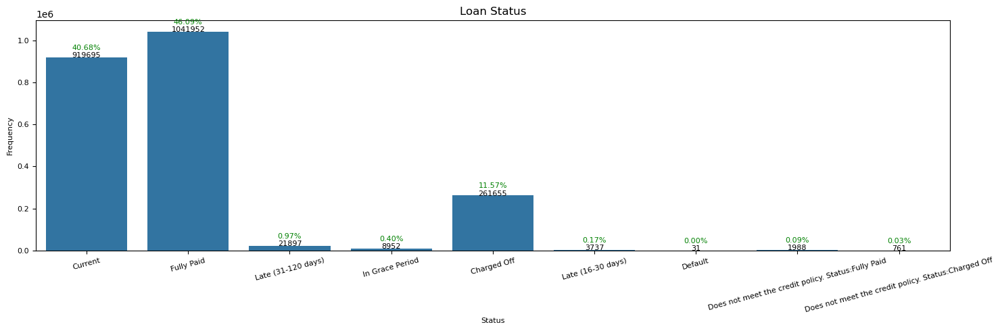

In [12]:
plt.figure(figsize=(15, 5))

ax = sns.countplot(x='loan_status', data=df_loan)
plt.title('Loan Status')
plt.xlabel('Status', fontsize=8)
plt.ylabel('Frequency', fontsize=8)
plt.tick_params(axis='both', labelsize=8)
plt.tick_params(axis='x', rotation=15)

# Adding bars label
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), ha='center', va='center', fontsize=8, textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(df_loan)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 10), ha='center', va='center', fontsize=8, color='green', textcoords='offset points')
    
plt.tight_layout()
plt.show()
    

In [13]:
df_loan['loan_status'].value_counts()

loan_status
Fully Paid                                             1041952
Current                                                 919695
Charged Off                                             261655
Late (31-120 days)                                       21897
In Grace Period                                           8952
Late (16-30 days)                                         3737
Does not meet the credit policy. Status:Fully Paid        1988
Does not meet the credit policy. Status:Charged Off        761
Default                                                     31
Name: count, dtype: int64

In [14]:
exp_data = df_loan.copy()

# Create a target column
exp_data['loan_status'] = exp_data['loan_status'].apply(lambda x: 0 if x in ['Current', 'Fully Paid', 'Does not meet the credit policy. Status:Fully Paid'] else 1)
exp_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,NaN,NaN,2500,2500,2500.0,36 months,13.56,84.92,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,30000,30000,30000.0,60 months,18.94,777.23,D,D2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,5000,5000,5000.0,36 months,17.97,180.69,D,D1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,4000,4000,4000.0,36 months,18.94,146.51,D,D2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,30000,30000,30000.0,60 months,16.14,731.78,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
# Convert to datetime 
time_features = ['issue_d', 'earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d']
for time in time_features:
    exp_data[time] = pd.to_datetime(exp_data[time], format='%b-%Y')


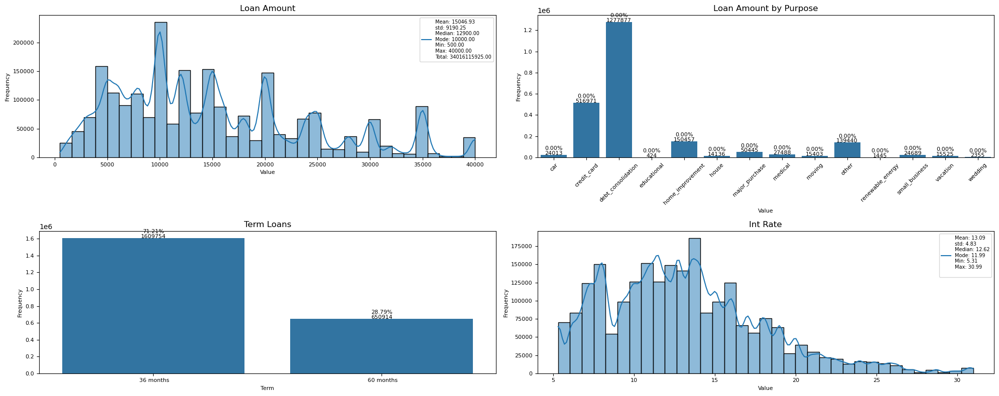

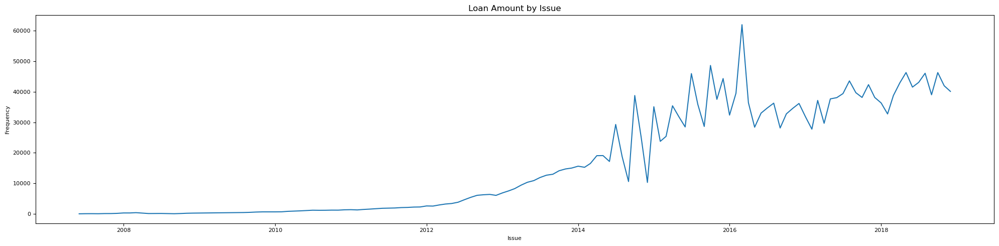

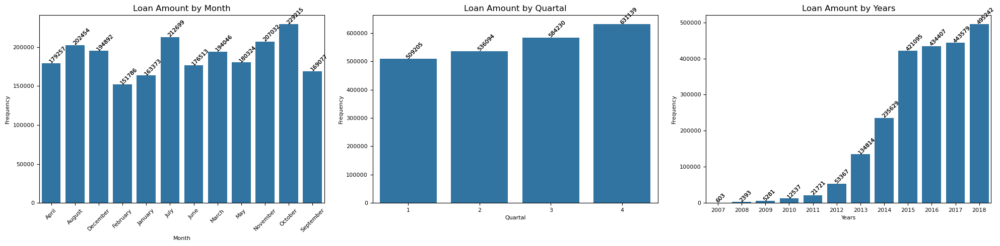

In [16]:
# Amount by TIme
exp_data['issue_years'] = exp_data['issue_d'].dt.year
exp_data['issue_month'] = exp_data['issue_d'].dt.month_name()
exp_data['issue_quartal'] = exp_data['issue_d'].dt.quarter

amnt_by_issue = exp_data.groupby(['issue_d'])['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_year = exp_data.groupby('issue_years')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_month = exp_data.groupby('issue_month')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_quartal = exp_data.groupby('issue_quartal')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()

# Group amount by purpose
amnt_by_purpose = exp_data.groupby('purpose')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()

# Plotting
fig, ax = plt.subplots(2, 2, figsize=(20, 8))
# TOTAL LOAN

sns.histplot(df_loan['loan_amnt'], bins=35, kde=True, ax=ax[0, 0])
ax[0, 0].set_title('Loan Amount')
ax[0, 0].set_xlabel('Value', fontsize=8)
ax[0, 0].set_ylabel('Frequency', fontsize=8)
ax[0, 0].tick_params(axis='both', labelsize=8)

# Statistics
mean = df_loan['loan_amnt'].mean()
std = df_loan['loan_amnt'].std()
median = df_loan['loan_amnt'].median()
mode_series = df_loan['loan_amnt'].mode()
mode = mode_series.iloc[0] if not mode_series.empty else np.nan
min_value = df_loan['loan_amnt'].min()
max_value = df_loan['loan_amnt'].max()
total = df_loan['loan_amnt'].sum()

# Menambahkan statistik ke dalam legenda
stats_text = (f'Mean: {mean:.2f}\n'
              f'std: {std:.2f}\n'
              f'Median: {median:.2f}\n'
              f'Mode: {mode:.2f}\n'
              f'Min: {min_value:.2f}\n'
              f'Max: {max_value:.2f}\n'
              f'Total: {total:.2f}')

ax[0, 0].legend([stats_text], loc='upper right', fontsize=7)

# loan Amount by Purpose
sns.barplot(x='purpose', y='total', data=amnt_by_purpose, ax=ax[0, 1])
ax[0, 1].set_title('Loan Amount by Purpose')
ax[0, 1].set_xlabel('Value', fontsize=8)
ax[0, 1].set_ylabel('Frequency', fontsize=8)
ax[0, 1].tick_params(axis='both', labelsize=8)
ax[0, 1].tick_params(axis='x', rotation=45)

for p in ax[0, 1].patches:
    ax[0, 1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', textcoords='offset points')
    ax[0, 1].annotate(f'{(p.get_height() / sum(exp_data.loan_amnt)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 7), fontsize=8, ha='center', textcoords='offset points')

# loan term
sns.countplot(x='term', data=exp_data, ax=ax[1, 0])
ax[1, 0].set_title('Term Loans')
ax[1, 0].set_xlabel('Term', fontsize=8)
ax[1, 0].set_ylabel('Frequency', fontsize=8)
ax[1, 0].tick_params(axis='both', labelsize=8)

for p in ax[1, 0].patches:
    ax[1, 0].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', textcoords='offset points')
    ax[1, 0].annotate(f'{(p.get_height() / len(exp_data)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 7), fontsize=8, ha='center', textcoords='offset points')

# Int Rate
sns.histplot(exp_data['int_rate'], bins=35, kde=True, ax=ax[1, 1])
ax[1, 1].set_title('Int Rate')
ax[1, 1].set_xlabel('Value', fontsize=8)
ax[1, 1].set_ylabel('Frequency', fontsize=8)
ax[1, 1].tick_params(axis='both', labelsize=8)

# Statistics
mean = exp_data['int_rate'].mean()
std = exp_data['int_rate'].std()
median = exp_data['int_rate'].median()
mode_series = exp_data['int_rate'].mode()
mode = mode_series.iloc[0] if not mode_series.empty else np.nan
min_value = exp_data['int_rate'].min()
max_value = exp_data['int_rate'].max()

# Menambahkan statistik ke dalam legenda
stats_text = (f'Mean: {mean:.2f}\n'
              f'std: {std:.2f}\n'
              f'Median: {median:.2f}\n'
              f'Mode: {mode:.2f}\n'
              f'Min: {min_value:.2f}\n'
              f'Max: {max_value:.2f}\n')

ax[1, 1].legend([stats_text], loc='upper right', fontsize=7)

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 5))
# Loan Amount by Issue
axis = sns.lineplot(x='issue_d', y='total', data=amnt_by_issue)
plt.title('Loan Amount by Issue')
plt.xlabel('Issue', fontsize=8)
plt.ylabel('Frequency', fontsize=8)
plt.tick_params(axis='both', labelsize=8)

for p in axis.patches:
    axis.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', textcoords='offset points')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Loan Amount by Year
sns.barplot(x='issue_month', y='total', data=amnt_by_month, ax=ax[0])
ax[0].set_title('Loan Amount by Month')
ax[0].set_xlabel('Month', fontsize=8)
ax[0].set_ylabel('Frequency', fontsize=8)
ax[0].tick_params(axis='both', labelsize=8)
ax[0].tick_params(axis='x', rotation=45)

for p in ax[0].patches:
    ax[0].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')
    ax[0].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')

# Loan Amount by Year
sns.barplot(x='issue_quartal', y='total', data=amnt_by_quartal, ax=ax[1])
ax[1].set_title('Loan Amount by Quartal')
ax[1].set_xlabel('Quartal', fontsize=8)
ax[1].set_ylabel('Frequency', fontsize=8)
ax[1].tick_params(axis='both', labelsize=8)

for p in ax[1].patches:
    ax[1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')
    ax[1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')

# Loan Amount by Year
sns.barplot(x='issue_years', y='total', data=amnt_by_year, ax=ax[2])
ax[2].set_title('Loan Amount by Years')
ax[2].set_xlabel('Years', fontsize=8)
ax[2].set_ylabel('Frequency', fontsize=8)
ax[2].tick_params(axis='both', labelsize=8)

for p in ax[2].patches:
    ax[2].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')
    ax[2].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-4, 0), fontsize=8, va='baseline', rotation=45, textcoords='offset points')
    
plt.tight_layout()
plt.show()

Lending club sejauh ini dari tahun 2007 hingga 2018 sudah menggelontorkan total pinjaman sebesar 34 Milliar US Dollar ($34.016.115.925), dengan menawarkan pinjaman mulai dari $500 hingga $40.000 dengan rata-rata pinjaman sebesar $12.900. Trend pinjaman setiap tahunnya meningkat secara fluktuatif dengan demand yang paling tinggi terjadi pada bulan Maret tahun 2016. Jika berdasarkan pada frequensi per bulan, per quartal, dan per tahun, uang yang digelontorkan paling tinggi di bulan Oktober ($3.434.130.500), di quartal 4 ($9.477.213.675), tahun 2018 ($7.936.263.150). Sebagian besar tujuan pengajuan pinjaman karena Debt Consoldation, kemudian diurutan kedua yaitu Credit Card.     

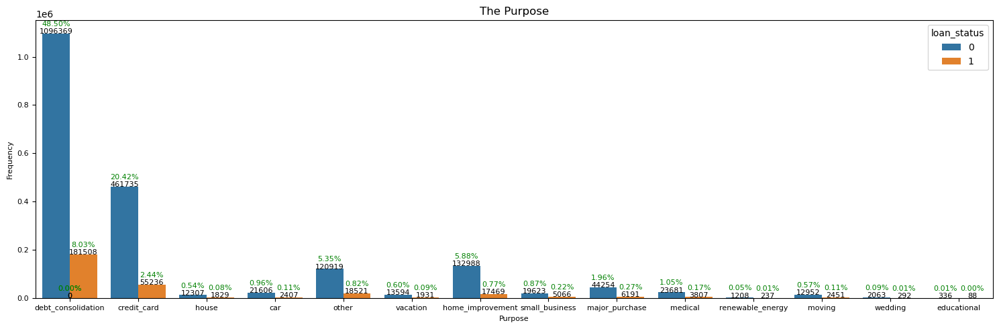

In [17]:
# Plot purpose
plt.figure(figsize=(15, 5))

ax = sns.countplot(x='purpose', hue='loan_status', data=exp_data)
plt.title('The Purpose')
plt.xlabel('Purpose', fontsize=8)
plt.ylabel('Frequency', fontsize=8)
plt.tick_params(axis='both', labelsize=8)
# plt.tick_params(axis='x', rotation=15)

# Adding bars label
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), ha='center', va='center', fontsize=8, textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(exp_data)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 10), ha='center', va='center', fontsize=8, color='green', textcoords='offset points')
    
plt.tight_layout()
plt.show()
    

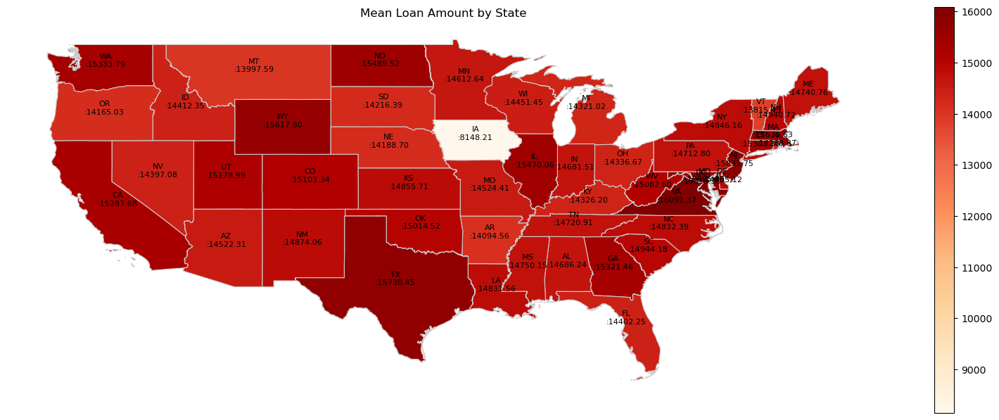

In [18]:
# Unzip the file manually or via Python (if needed)
import zipfile
import geopandas as gpd

addr_amnt = exp_data[['loan_amnt', 'addr_state']]
addr_amnt = addr_amnt.groupby('addr_state')['loan_amnt'].agg(total_amnt='sum', count_amnt='count', mean_amnt='mean').reset_index()

zip_path = r'D:\Project_Data\Loan CLub Loan Data\cb_2020_us_state_500k.zip'
extract_path = r'D:\Project_Data\Loan CLub Loan Data\extracted'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Now read the shapefile directly
shapefile_path = extract_path + '\cb_2020_us_state_500k.shp'
gdf_states = gpd.read_file(shapefile_path)

# Merge the shapefile GeoDataFrame with the aggregated data
gdf_states = gdf_states.merge(addr_amnt, left_on='STUSPS', right_on='addr_state')

# Filter geometries with x-coordinate (longitude) less than -50
gdf_states = gdf_states[gdf_states.geometry.apply(lambda x: (x.bounds[2] < -50) & (x.bounds[2] > -140))]

# Plot
fig, ax = plt.subplots(1, 1, figsize=(20, 15))
gdf_states.plot(column='mean_amnt', cmap='OrRd', linewidth=0.8, edgecolor='0.8', legend=True, ax=ax,
                legend_kwds={'shrink': 0.5})

# Add labels for state and mean_amnt
for idx, row in gdf_states.iterrows():
    plt.annotate(
        text=f"{row['STUSPS']}\n:{row['mean_amnt']:.2f}",
        xy=(row.geometry.centroid.x, row.geometry.centroid.y),
        ha='center',
        fontsize=8,
        color='black'
    )

# Title and remove axis
plt.title('Mean Loan Amount by State')
plt.axis('off')
plt.show()

In [19]:
gdf_states[['NAME', 'count_amnt']].sort_values(by='count_amnt', ascending=False)

,NAME,count_amnt
2,California,314533
14,New York,186389
33,Texas,186335
44,Florida,161991
20,Illinois,91173
22,New Jersey,83132
7,Pennsylvania,76939
34,Ohio,75132
5,Georgia,74196
39,Virginia,62954


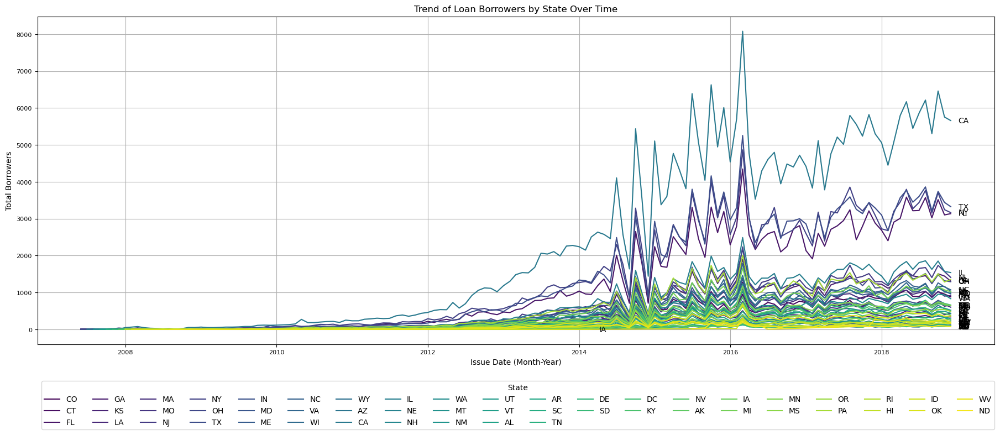

In [20]:
trend_loan_by_state = exp_data[['issue_d', 'loan_amnt', 'addr_state']]
trend_loan_by_state['issue_d'] = trend_loan_by_state['issue_d'].dt.to_period('M')
group = trend_loan_by_state.groupby(['issue_d', 'addr_state']).agg(total_borrowers=('addr_state', 'count')).reset_index()
# Convert 'issue_d' back to datetime for plotting
group['issue_d'] = group['issue_d'].dt.to_timestamp()

# Buat plot garis
plt.figure(figsize=(20, 8))
sns.lineplot(data=group, x='issue_d', y='total_borrowers', hue='addr_state', palette='viridis')

# Atur label dan judul
plt.title('Trend of Loan Borrowers by State Over Time')
plt.xlabel('Issue Date (Month-Year)')
plt.ylabel('Total Borrowers')
plt.tick_params(axis='both', labelsize=8)

# Menambahkan label pada setiap garis di titik akhir
for state in group['addr_state'].unique():
    state_data = group[group['addr_state'] == state]
    plt.annotate(
        text=state,
        xy=(state_data['issue_d'].max(), state_data['total_borrowers'].values[-1]),
        xytext=(10, 0),
        textcoords='offset points',
        fontsize=10,
        ha='left',
        va='center',
    )

# plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(title='State', bbox_to_anchor=(-0, -0.1), loc='upper left', fontsize=10, ncol=20)
plt.grid(True)
plt.tight_layout()

# Tampilkan plot
plt.show()

In [21]:
import plotly.express as px
# Buat plot garis dengan Plotly
fig = px.line(
    group, 
    x='issue_d', 
    y='total_borrowers', 
    color='addr_state',  
    labels={'issue_d': 'Issue Date (Month-Year)', 'total_borrowers': 'Total Borrowers', 'addr_state': 'State'},
    title='Trend of Loan Borrowers by State Over Time'
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title='Issue Date (Month-Year)',
    yaxis_title='Total Borrowers',
    legend_title_text='State',
    legend=dict(
        x=1.05,
        y=1,
        title_text='State',
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    )
)

# Tampilkan plot
fig.show()

In [22]:
group.sort_values(by='total_borrowers')

,issue_d,addr_state,total_borrowers
0,2007-06-01,CO,1
462,2008-10-01,KS,1
460,2008-10-01,HI,1
452,2008-09-01,WI,1
448,2008-09-01,SC,1
...,...,...,...
5740,2018-08-01,CA,6216
3914,2015-07-01,CA,6389
5840,2018-10-01,CA,6462
4059,2015-10-01,CA,6630


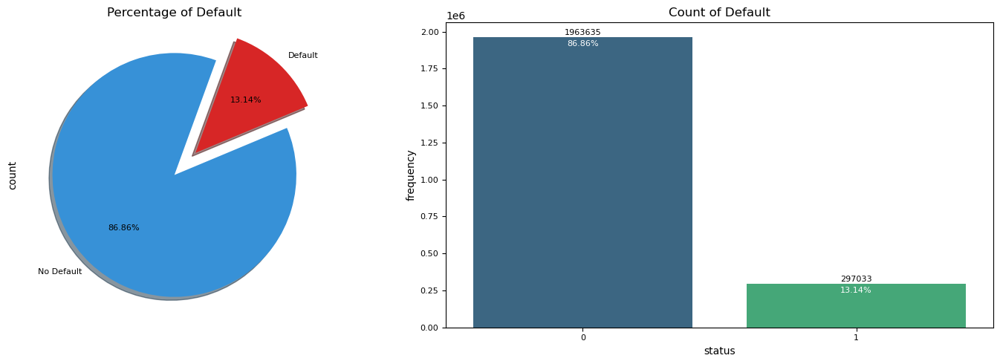

In [23]:
# Only the Default variable
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Pie chart for Default target
colors = ["#3791D7", "#D72626"]
labels = "No Default", "Default"
exp_data["loan_status"].value_counts().plot.pie(
    explode=[0, 0.25],
    autopct='%1.2f%%',
    shadow=True,
    colors=colors,
    labels=labels,
    fontsize=8,
    startangle=70,
    ax=ax[0]
)
ax[0].set_title('Percentage of Default')
ax[0].tick_params(axis='both', labelsize=8)

# Bar chart for loan status
sns.countplot(data=exp_data, x='loan_status', ax=ax[1], palette='viridis')
ax[1].set_title('Count of Default')
ax[1].set_xlabel('status')
ax[1].set_ylabel('frequency')
ax[1].tick_params(axis='both', labelsize=8)

for p in ax[1].patches:
    ax[1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), fontsize=8, ha='center', textcoords='offset points')
    ax[1].annotate(f'{(p.get_height() / len(exp_data)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, -9), fontsize=8, color='white', ha='center', textcoords='offset points')

plt.tight_layout()
plt.show()

In [29]:
round(exp_data['recoveries'].value_counts() / len(exp_data),2)

recoveries
0.00       0.92
100.00     0.00
50.00      0.00
150.00     0.00
200.00     0.00
           ... 
1007.31    0.00
1574.66    0.00
829.69     0.00
2759.19    0.00
5310.46    0.00
Name: count, Length: 127920, dtype: float64

In [24]:
# Correlation features of the loan_status feature
corr_matrix = exp_data.select_dtypes(include=['int', 'float']).corr()
corr_matrix['loan_status'].sort_values(ascending=False)

loan_status                1.000000
recoveries                 0.482023
collection_recovery_fee    0.457007
hardship_dpd               0.244578
int_rate                   0.209173
                             ...   
member_id                       NaN
url                             NaN
policy_code                     NaN
deferral_term                   NaN
hardship_length                 NaN
Name: loan_status, Length: 112, dtype: float64

In [22]:
corr_matrix['loan_status'].sort_values(ascending=False).head(25)

loan_status                                   1.000000
recoveries                                    0.482023
collection_recovery_fee                       0.457007
hardship_dpd                                  0.244578
int_rate                                      0.209173
total_rec_late_fee                            0.143870
sec_app_inq_last_6mths                        0.098082
acc_open_past_24mths                          0.094439
hardship_amount                               0.094319
orig_projected_additional_accrued_interest    0.085823
inq_last_6mths                                0.085547
num_tl_op_past_12m                            0.083877
open_rv_24m                                   0.078784
percent_bc_gt_75                              0.074423
inq_last_12m                                  0.073985
bc_util                                       0.071719
all_util                                      0.070407
open_acc_6m                                   0.066933
open_rv_12

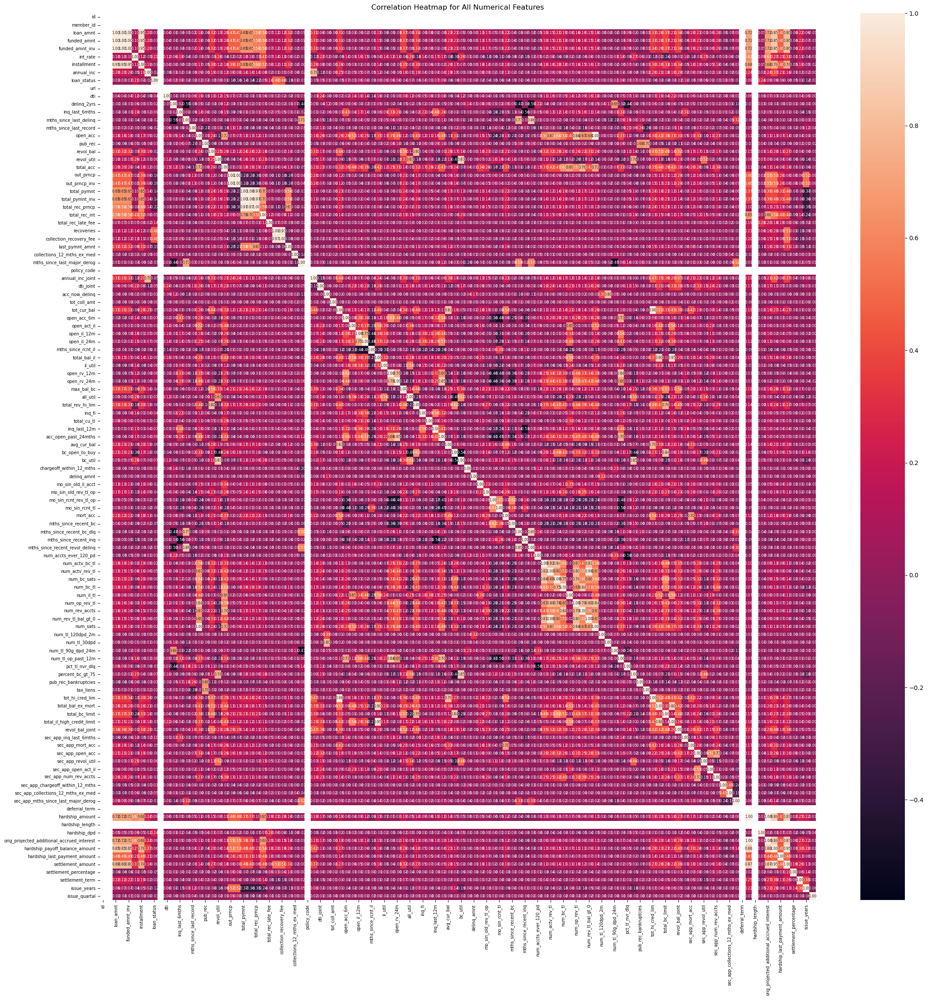

In [23]:
# CORRELATION BEETWEN NUMERIC COLUMNS
plt.figure(figsize=(23, 23))

sns.heatmap(corr_matrix, annot=True, fmt='.2f', annot_kws={"fontsize": 6})
plt.title('Correlation Heatmap for All Numerical Features')
plt.tick_params(axis='both', labelsize=7)
plt.tick_params(axis='x', rotation=90)

# Show the plot
plt.tight_layout()
plt.show()

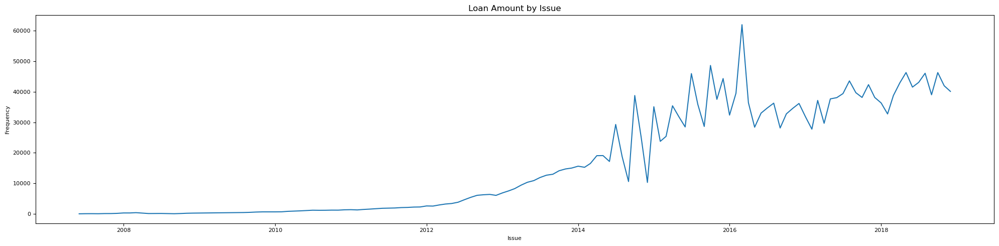

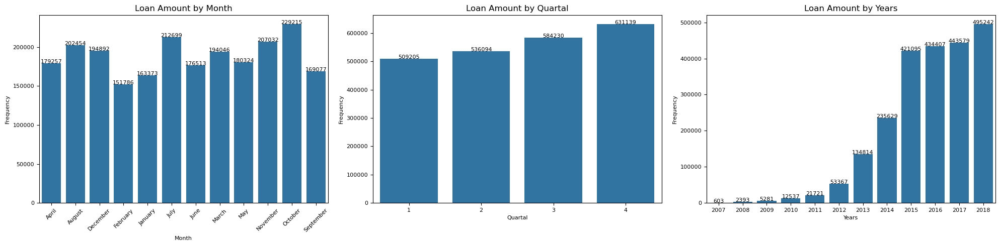

In [24]:
default_loan = exp_data[exp_data['loan_status'] == 1]

# Amount by Time
exp_data['issue_years'] = exp_data['issue_d'].dt.year
exp_data['issue_month'] = exp_data['issue_d'].dt.month_name()
exp_data['issue_quartal'] = exp_data['issue_d'].dt.quarter

amnt_by_issue_default = exp_data.groupby(['issue_d'])['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_year_default = exp_data.groupby('issue_years')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_month_default = exp_data.groupby('issue_month')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()
amnt_by_quartal_default = exp_data.groupby('issue_quartal')['loan_amnt'].agg(total_amnt='sum', total='count').reset_index()

plt.figure(figsize=(20, 5))
# Loan Amount by Issue
ax = sns.lineplot(x='issue_d', y='total', data=amnt_by_issue_default)
plt.title('Loan Amount by Issue')
plt.xlabel('Issue', fontsize=8)
plt.ylabel('Frequency', fontsize=8)
plt.tick_params(axis='both', labelsize=8)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', textcoords='offset points')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Loan Amount by Year
sns.barplot(x='issue_month', y='total', data=amnt_by_month_default, ax=ax[0])
ax[0].set_title('Loan Amount by Month')
ax[0].set_xlabel('Month', fontsize=8)
ax[0].set_ylabel('Frequency', fontsize=8)
ax[0].tick_params(axis='both', labelsize=8)
ax[0].tick_params(axis='x', rotation=45)

for p in ax[0].patches:
    ax[0].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', va='baseline', textcoords='offset points')

# Loan Amount by Year
sns.barplot(x='issue_quartal', y='total', data=amnt_by_quartal_default, ax=ax[1])
ax[1].set_title('Loan Amount by Quartal')
ax[1].set_xlabel('Quartal', fontsize=8)
ax[1].set_ylabel('Frequency', fontsize=8)
ax[1].tick_params(axis='both', labelsize=8)

for p in ax[1].patches:
    ax[1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', va='baseline', textcoords='offset points')

# Loan Amount by Year
sns.barplot(x='issue_years', y='total', data=amnt_by_year_default, ax=ax[2])
ax[2].set_title('Loan Amount by Years')
ax[2].set_xlabel('Years', fontsize=8)
ax[2].set_ylabel('Frequency', fontsize=8)
ax[2].tick_params(axis='both', labelsize=8)

for p in ax[2].patches:
    ax[2].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 0), fontsize=8, ha='center', va='baseline', textcoords='offset points')
    
plt.tight_layout()
plt.show()

Borrower Characteristics

### Data Preparation

#### Clean Data

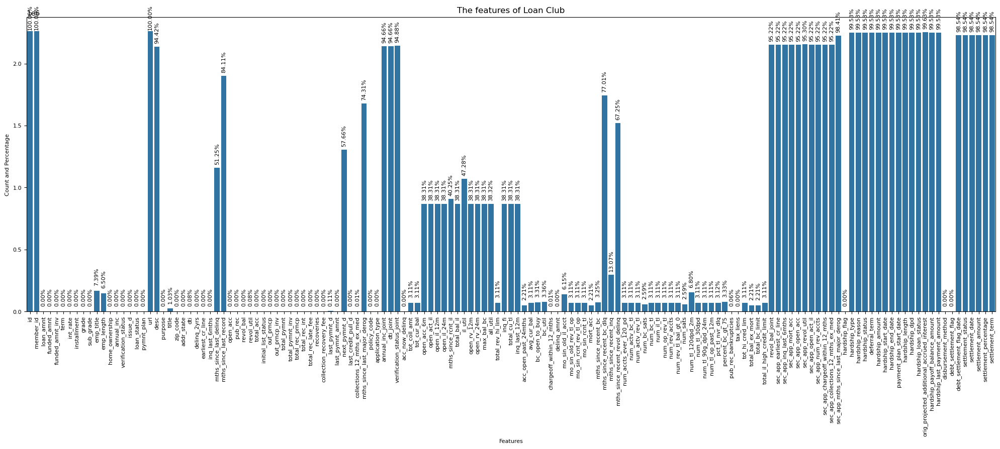

In [6]:
# Delete Feature that have missing values more than 50%
missing_values = df_loan.isna().sum().to_frame(name='total')

# Plot
plt.figure(figsize=(20, 9))
ax = sns.barplot(x=missing_values.index, y='total', data=missing_values)
plt.title('The features of Loan Club')
plt.xlabel('Features', fontsize=8)
plt.ylabel('Count and Percentage', fontsize=8)
plt.tick_params(axis='both', labelsize=8)
plt.tick_params(axis='x', rotation=90)

# Adding label of bars
for p in ax.patches:
    # ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 4), ha='center', va='center', fontsize=8, color='black', rotation=90, textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(df_loan)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 20), ha='center', va='center', fontsize=8, color='black', rotation=90, textcoords='offset points')

plt.tight_layout()
plt.show()

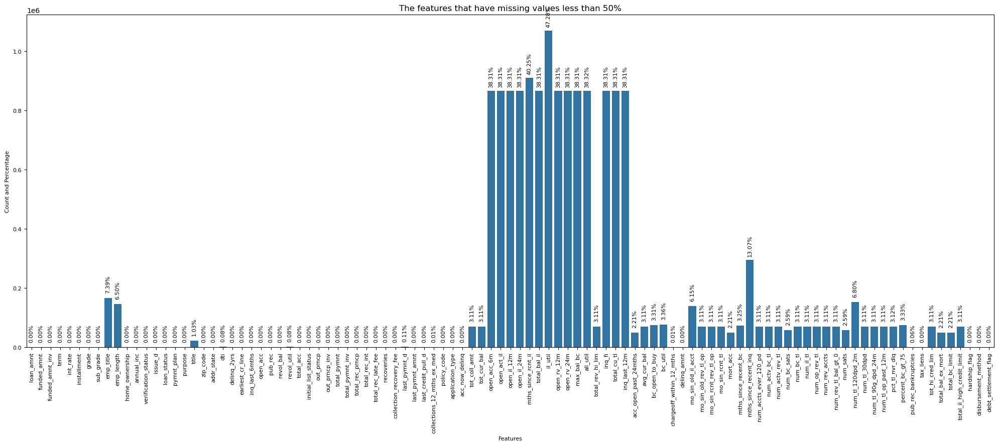

In [19]:
# Delete Feature that have missing values more than 50%
missing_values_under_50 = summary_df_loan[summary_df_loan['null_values(%)'] <= 50]['feature'].tolist()
missing_values_under_50 = df_loan[missing_values_under_50]
missing_value_amnt = missing_values_under_50.isna().sum().to_frame(name='total')

# Plot missing value less than 50%
plt.figure(figsize=(20, 9))
ax = sns.barplot(x=missing_value_amnt.index, y='total', data=missing_value_amnt)
plt.title('The features that have missing values less than 50%')
plt.xlabel('Features', fontsize=8)
plt.ylabel('Count and Percentage', fontsize=8)
plt.tick_params(axis='both', labelsize=8)
plt.tick_params(axis='x', rotation=90)

# Adding label of bars
for p in ax.patches:
    # ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 4), ha='center', va='center', fontsize=8, color='black', rotation=90, textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(df_loan)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 20), ha='center', va='center', fontsize=8, color='black', rotation=90, textcoords='offset points')

plt.tight_layout()
plt.show()

In [20]:
# DELETE FEATURE UN-RELEVANT
feature_delete = ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'sub_grade', 'emp_title', 'title', 'zip_code', 'addr_state', 'initial_list_status', 'out_prncp_inv', 
                  'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 
                  'collections_12_mths_ex_med', 'policy_code', 'application_type', 'disbursement_method', 'debt_settlement_flag',]

# Drop feature
missing_values_under_50.drop(columns=feature_delete, inplace=True)

# Count of features
print(f'Amount of features currently: {len(missing_values_under_50.columns)}')

Amount of features currently: 77


In [21]:
# Dropna
missing_values_under_50.dropna(inplace=True)

In [22]:
missing_values_under_50.shape

(941572, 77)

#### Transform Data

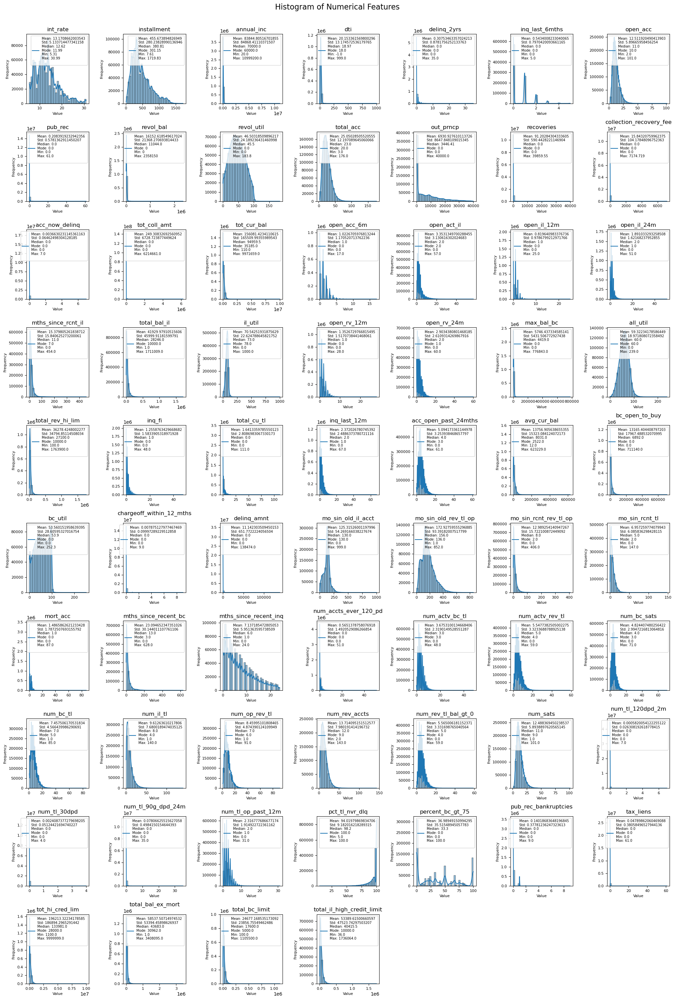

In [31]:
# Check Histogram of each feature
histogram_features = missing_values_under_50.select_dtypes(include=['int', 'float']).columns

# Init rows and cols
num_cols = len(histogram_features)
num_rows = int((num_cols + 2) // 6.5)
# print(num_cols, num_rows)

fig, axes = plt.subplots(num_rows, 7, figsize=(20, num_rows * 3))

fig.suptitle('Histogram of Numerical Features', fontsize=16)
for i, col in enumerate(histogram_features):
    ax = axes[i // 7, i % 7]
    sns.histplot(missing_values_under_50[col], bins=35, kde=True, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value', fontsize=8)
    ax.set_ylabel('Frequency', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    
    # Statistics
    mean = missing_values_under_50[col].mean()
    std = missing_values_under_50[col].std()
    median = missing_values_under_50[col].median()
    mode_series = missing_values_under_50[col].mode()
    mode = mode_series.iloc[0] if not mode_series.empty else np.nan
    min_ = missing_values_under_50[col].min()
    max_ = missing_values_under_50[col].max()
    
    stats_text = (f'Mean: {mean} \n'
             f'Std: {std}\n'
             f'Median: {median}\n'
             f'Mode: {mode}\n'
             f'Min: {min_}\n'
             f'Max: {max_}\n')
    
    ax.legend([stats_text], loc='upper right', fontsize=7)
    
for i in range(num_cols, num_rows * 7):
    fig.delaxes(axes.flatten()[i])
    
plt.tight_layout()
plt.subplots_adjust(top=0.95)

plt.show()
    
    

In [23]:
# Create a default column to be the targe
missing_values_under_50['default'] = missing_values_under_50['loan_status'].apply(lambda x: 0 if x in ['Fully Paid', 'Current', 'Does not meet the credit policy. Status:Fully Paid'] else 1)

# Drop loan status column 
missing_values_under_50.drop(columns='loan_status', inplace=True)


In [24]:
# Data with max value less than 340
describe_missing_values_under_50 = missing_values_under_50.select_dtypes(include=['int', 'float']).describe().T

# Filtering under 340
filter_ = missing_values_under_50[describe_missing_values_under_50[(describe_missing_values_under_50['max'] < 340)].index.tolist()]

# Define binning
def bins_3(value):
    if value == 0:
        return '0 bins'
    elif value in [1, 2]:
        return '1-2 bins'
    else:
        return '> 2 bins'
    
def bins_4(value):
    if value == 0:
        return '0 bins'
    elif value in [1, 2]:
        return '1-3 bins'
    elif value in [3, 4, 5]:
        return '2-5 bins'
    else:
        return '> 5 bins'
    
def bins_5_ver1(value):
    if value == 0:
        return '0 bins'
    elif value in [1]:
        return '1 bins'
    elif value in [2]:
        return '2 bins'
    elif value in [3, 4, 5]:
        return '3-5 bins'
    else:
        return '> 5 bins'
    
def bins_5_ver2(value):
    if value == 0:
        return '0 bins'
    elif value in [1-2]:
        return '1-2 bins'
    elif value in [3-5]:
        return '3-5 bins'
    elif value in [6-10]:
        return '6-10 bins'
    else:
        return '> 10 bins'
    
def bins_pct_tl(value):
    if value <= 75:
        return 'under 75 bins'
    elif (value > 75 ) & (value <= 85):
        return '76 to 85 bins'
    elif (value > 85) & (value <= 95):
        return '86 to 95 bins'
    else:
        return '> 95 bins'
    
# Define custom binning function for inq.last.6mnths feature
def bins_biner(value):
    if value == 0:
        return '0 bins'
    else:
        return '> 0 bins'
    
def apply_bins(df, new_feature, old_feature, func):
    df[new_feature] = df[old_feature].apply(func)
    return df

def apply_bins(df, new_feature, old_feature, func):
    df[new_feature] = df[old_feature].apply(func)
    return df

# Filtering some feature didn't transform
not_tranform_features = ['int_rate', 'all_util', 'ill_util', 'bc_util', 'revol_util', 'under_340_max2yrs', 'open_il_12m', 'open_il_24m', 'inq_last_12m', 'num_bc_tl', 'num_il_tl', 'num_rev_accts', 'num_sats', 
                         'num_op_rev_tl','num_actv_rev_tl', 'mo_sin_rcnt_tl', 'inq_last_12m', 'mths_since_recent_inq', 'percent_bc_gt_75', 'default']
transform_bin = [col for col in filter_.columns if col not in not_tranform_features]

transform_bin_2 = ['acc_now_delinq', 'chargeoff_within_12_mths', 'num_tl_90g_dpd_24m', 'pub_rec', 'pub_rec_bankruptcies', 'num_tl_120dpd_2m', 'num_tl_30dpd']
col_transform = [col for col in transform_bin if col not in transform_bin_2]
col_transform_biner = [col for col in transform_bin if col in transform_bin_2]

for col in col_transform:
    apply_bins(missing_values_under_50, col+'_bin', col, bins_4)    

for col in col_transform_biner:
    apply_bins(missing_values_under_50, col+'_bin', col, bins_biner)    
    
apply_bins(missing_values_under_50, 'pct_tl_nvr_dlq_bin', 'pct_tl_nvr_dlq', bins_pct_tl)   

# Bins np
missing_values_under_50['num_rev_tl_bal_gt_0' + '_bin'] = np.floor_divide(missing_values_under_50['num_rev_tl_bal_gt_0'], 3).astype('int')
missing_values_under_50['acc_open_past_24mths' + '_bin'] = np.floor_divide(missing_values_under_50['acc_open_past_24mths'], 4).astype('int')
missing_values_under_50['total_acc' + '_bin'] = np.floor_divide(missing_values_under_50['total_acc'], 10)
missing_values_under_50['open_acc' + '_bin'] = np.floor_divide(missing_values_under_50['open_acc'], 7)
missing_values_under_50['num_rev_accts' + '_bin'] = np.floor_divide(missing_values_under_50['num_rev_accts'], 7).astype('int')
missing_values_under_50['num_sats' + '_bin'] = np.floor_divide(missing_values_under_50['num_sats'], 6).astype('int')

# Dealing outlier at new bins in bins_np var
missing_values_under_50['num_rev_tl_bal_gt_0_bin'] = np.where(missing_values_under_50['num_rev_tl_bal_gt_0_bin'] > 3, 4, missing_values_under_50['num_rev_tl_bal_gt_0_bin'])
missing_values_under_50['acc_open_past_24mths_bin'] = np.where(missing_values_under_50['acc_open_past_24mths_bin'] > 2, 3, missing_values_under_50['acc_open_past_24mths_bin'])
missing_values_under_50['total_acc_bin'] = np.where(missing_values_under_50['total_acc_bin'] > 5, 6, missing_values_under_50['total_acc_bin'])
missing_values_under_50['open_acc_bin'] = np.where(missing_values_under_50['open_acc_bin'] > 3, 4, missing_values_under_50['open_acc_bin'])
missing_values_under_50['num_rev_accts_bin'] = np.where(missing_values_under_50['num_rev_accts_bin'] > 3, 4, missing_values_under_50['num_rev_accts_bin'])
missing_values_under_50['num_sats_bin'] = np.where(missing_values_under_50['num_sats_bin'] > 3, 4, missing_values_under_50['num_sats_bin'])

# # Bins 3
bins3 = ['delinq_2yrs', 'open_il_12m'] # delinq_2yrs, open_acc_6m, open_il_12m
for col in bins3:
    apply_bins(missing_values_under_50, col+'_bin', col, bins_3) 
    
# Bins 5 ver 1
bin5_ver1 = ['open_il_24m', 'inq_last_12m'] 
for col in bin5_ver1:
    apply_bins(missing_values_under_50, col+'_bin', col, bins_5_ver1) 

# Bins 5 ver2
bin5_ver2 = ['num_bc_tl', 'num_il_tl', 'num_op_rev_tl','num_actv_rev_tl', 'mo_sin_rcnt_tl', 'inq_last_12m', 'mths_since_recent_inq', ] # mo_sin_rcnt_tl, mths_since_recent_inq, num_bc_tl, num_il_tl, num_op_rev_tl, num_acctv_rev_tl
for col in bin5_ver2:
    apply_bins(missing_values_under_50, col+'_bin', col, bins_5_ver2) 
    
# Reduce the value that more than 100 to 100
missing_values_under_50['revol_util'] = np.where(missing_values_under_50['revol_util'] > 100, 100, missing_values_under_50['revol_util'])
missing_values_under_50['bc_util'] = np.where(missing_values_under_50['bc_util'] > 100, 100, missing_values_under_50['bc_util'])

# Drop columns
col_np = ['num_rev_tl_bal_gt_0', 'acc_open_past_24mths', 'total_acc', 'open_acc', 'num_rev_accts', 'num_sats']
feature_del =  list(set(col_transform + col_transform_biner + col_np + bins3 + bin5_ver1 + bin5_ver2))
missing_values_under_50.drop(columns=feature_del, inplace=True)

# Encoder bins column
label_encoder = LabelEncoder()
feature_encoder = missing_values_under_50.iloc[:20, -37:].select_dtypes(include='object')
for enc in feature_encoder.columns:
    # Mengubah kolom kategorikal menjadi numerik
    missing_values_under_50[enc] = label_encoder.fit_transform(missing_values_under_50[enc])

missing_values_under_50

,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,purpose,...,num_sats_bin,open_il_12m_bin,open_il_24m_bin,inq_last_12m_bin,num_bc_tl_bin,num_il_tl_bin,num_op_rev_tl_bin,num_actv_rev_tl_bin,mo_sin_rcnt_tl_bin,mths_since_recent_inq_bin
0,13.56,84.92,C,10+ years,RENT,55000.0,Not Verified,Dec-2018,n,debt_consolidation,...,1,1,2,1,0,0,0,1,1,1
1,18.94,777.23,D,10+ years,MORTGAGE,90000.0,Source Verified,Dec-2018,n,debt_consolidation,...,2,1,3,1,0,0,0,1,1,1
2,17.97,180.69,D,6 years,MORTGAGE,59280.0,Source Verified,Dec-2018,n,debt_consolidation,...,1,0,2,0,0,0,0,1,1,1
3,18.94,146.51,D,10+ years,MORTGAGE,92000.0,Source Verified,Dec-2018,n,debt_consolidation,...,1,2,3,1,0,0,0,1,1,1
4,16.14,731.78,C,10+ years,MORTGAGE,57250.0,Not Verified,Dec-2018,n,debt_consolidation,...,2,2,3,0,0,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260658,16.02,364.94,C,< 1 year,RENT,85000.0,Verified,Oct-2017,n,debt_consolidation,...,3,2,4,1,0,0,0,1,0,0
2260662,30.75,984.47,F,6 years,MORTGAGE,100000.0,Verified,Oct-2017,n,debt_consolidation,...,1,1,3,1,0,0,0,1,1,1
2260663,14.08,279.72,C,10+ years,MORTGAGE,58000.0,Not Verified,Oct-2017,n,debt_consolidation,...,2,0,1,1,0,0,0,1,1,1
2260664,25.82,358.01,E,< 1 year,MORTGAGE,30000.0,Not Verified,Oct-2017,n,debt_consolidation,...,1,1,1,1,0,0,0,1,1,0


In [28]:
# missing_values_under_50['recoveries'].value_counts()
# missing_values_under_50['recoveries'].min()
missing_values_under_50['recoveries'].max()

39859.55

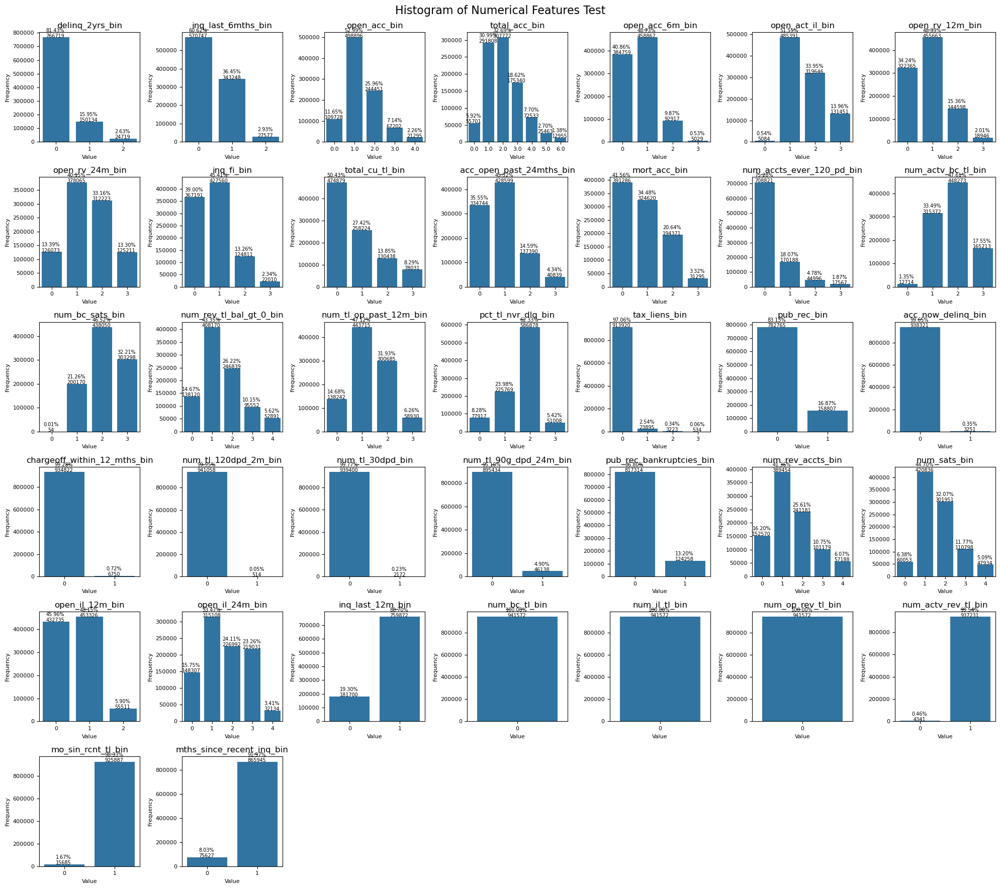

In [34]:
# Plot feature after binning
bins_features = missing_values_under_50.iloc[:, -37:].columns

num_cols = len(bins_features)
num_rows = (num_cols + 2) // 6

fig, axes = plt.subplots(num_rows, 7, figsize=(20, num_rows * 3))

fig.suptitle('Histogram of Numerical Features Test', fontsize=16)
for i, col in enumerate(bins_features):
    ax = axes[i // 7, i % 7]
    sns.countplot(x=col, data=missing_values_under_50, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value', fontsize=8)
    ax.set_ylabel('Frequency', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    
    for p in ax.patches:
        ax.annotate(f"{p.get_height():.0f}", (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 2), fontsize=7, ha='center', va='center', textcoords='offset points')
        ax.annotate(f"{(p.get_height() / len(missing_values_under_50) * 100):.2f}%", (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 10), fontsize=7, ha='center', va='center', textcoords='offset points')

# Deleting unuseful subplot
for i in range(num_cols, num_rows * 7):
    fig.delaxes(axes.flatten()[i])
    
# Adjust subplot layout
plt.tight_layout()
plt.subplots_adjust(top=0.95)

plt.show()


In [35]:
# Log data that have a max value is more than 340
log_feature = describe_missing_values_under_50[(describe_missing_values_under_50['max'] > 340)].index
for col_log in log_feature:
    missing_values_under_50[col_log + '_log'] = np.log1p(missing_values_under_50[col_log])
    
# Delete feature before log
missing_values_under_50.drop(columns=log_feature, inplace=True)
missing_values_under_50.head()

,int_rate,grade,emp_length,home_ownership,verification_status,issue_d,pymnt_plan,purpose,earliest_cr_line,revol_util,...,bc_open_to_buy_log,delinq_amnt_log,mo_sin_old_il_acct_log,mo_sin_old_rev_tl_op_log,mo_sin_rcnt_rev_tl_op_log,mths_since_recent_bc_log,tot_hi_cred_lim_log,total_bal_ex_mort_log,total_bc_limit_log,total_il_high_credit_limit_log
0,13.56,C,10+ years,RENT,Not Verified,Dec-2018,n,debt_consolidation,Apr-2001,10.3,...,10.444677,0.0,4.948760,5.361292,0.693147,0.693147,11.004181,9.735187,10.505095,9.805047
1,18.94,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Jun-1987,24.2,...,9.529666,0.0,5.099866,5.937536,1.609438,1.609438,12.828993,11.507601,9.615872,11.451826
2,17.97,D,6 years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Apr-2011,19.1,...,9.532496,0.0,4.477337,4.532599,2.772589,4.356709,11.827211,9.371609,9.532496,9.210440
3,18.94,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Feb-2006,78.1,...,7.122867,0.0,4.143135,5.043425,4.174387,4.174387,12.861476,10.495488,8.517393,10.714084
4,16.14,C,10+ years,MORTGAGE,Not Verified,Dec-2018,n,debt_consolidation,Dec-2000,3.6,...,9.044522,0.0,3.988984,5.379897,1.098612,1.098612,11.967492,10.298060,9.137877,10.383844


In [36]:
# Check log feature
missing_values_under_50.iloc[:, -26:].describe().T

,count,mean,std,min,25%,50%,75%,max
mths_since_recent_inq_bin,941572.0,0.919680,0.271788,0.000000,1.000000,1.000000,1.000000,1.000000
installment_log,941572.0,5.921522,0.675920,2.152924,5.528079,5.944923,6.417533,7.450562
annual_inc_log,941572.0,11.178318,0.533303,3.044522,10.819798,11.156265,11.512935,16.213333
dti_log,941572.0,-inf,NaN,-inf,2.663053,2.994231,3.277145,6.907755
revol_bal_log,941572.0,9.172763,1.243536,0.000000,8.662851,9.309733,9.889186,14.673388
out_prncp_log,941572.0,5.578620,4.392810,0.000000,0.000000,8.145379,9.325066,10.596660
recoveries_log,941572.0,0.336459,1.528695,0.000000,0.000000,0.000000,0.000000,10.593142
collection_recovery_fee_log,941572.0,0.253340,1.161044,0.000000,0.000000,0.000000,0.000000,8.878458
tot_coll_amt_log,941572.0,1.049316,2.385671,0.000000,0.000000,0.000000,0.000000,15.642422
tot_cur_bal_log,941572.0,11.385881,1.157225,4.709530,10.464388,11.461216,12.357828,16.115258


In [37]:
# Check log feature
missing_values_under_50.iloc[:4, -25:]

,installment_log,annual_inc_log,dti_log,revol_bal_log,out_prncp_log,recoveries_log,collection_recovery_fee_log,tot_coll_amt_log,tot_cur_bal_log,mths_since_rcnt_il_log,...,bc_open_to_buy_log,delinq_amnt_log,mo_sin_old_il_acct_log,mo_sin_old_rev_tl_op_log,mo_sin_rcnt_rev_tl_op_log,mths_since_recent_bc_log,tot_hi_cred_lim_log,total_bal_ex_mort_log,total_bc_limit_log,total_il_high_credit_limit_log
0,4.453417,10.915107,2.956991,8.376090,7.777801,0.0,0.0,0.000000,9.735187,1.098612,...,10.444677,0.0,4.948760,5.361292,0.693147,0.693147,11.004181,9.735187,10.505095,9.805047
1,6.657022,11.407576,3.314913,9.418655,10.288367,0.0,0.0,7.097549,12.682046,1.386294,...,9.529666,0.0,5.099866,5.937536,1.609438,1.609438,12.828993,11.507601,9.615872,11.451826
2,5.202302,10.990044,2.443216,8.433812,8.473912,0.0,0.0,0.000000,11.610959,2.708050,...,9.532496,0.0,4.477337,4.532599,2.772589,4.356709,11.827211,9.371609,9.532496,9.210440
3,4.993896,11.429555,2.875822,8.606851,8.251385,0.0,0.0,6.532334,12.628231,1.791759,...,7.122867,0.0,4.143135,5.043425,4.174387,4.174387,12.861476,10.495488,8.517393,10.714084


In [38]:
# Dealing infinity values
mode = missing_values_under_50['dti_log'].mode()[0]
missing_values_under_50['dti_log'] = np.where(missing_values_under_50['dti_log'] < 0, mode, missing_values_under_50['dti_log'])


25 4


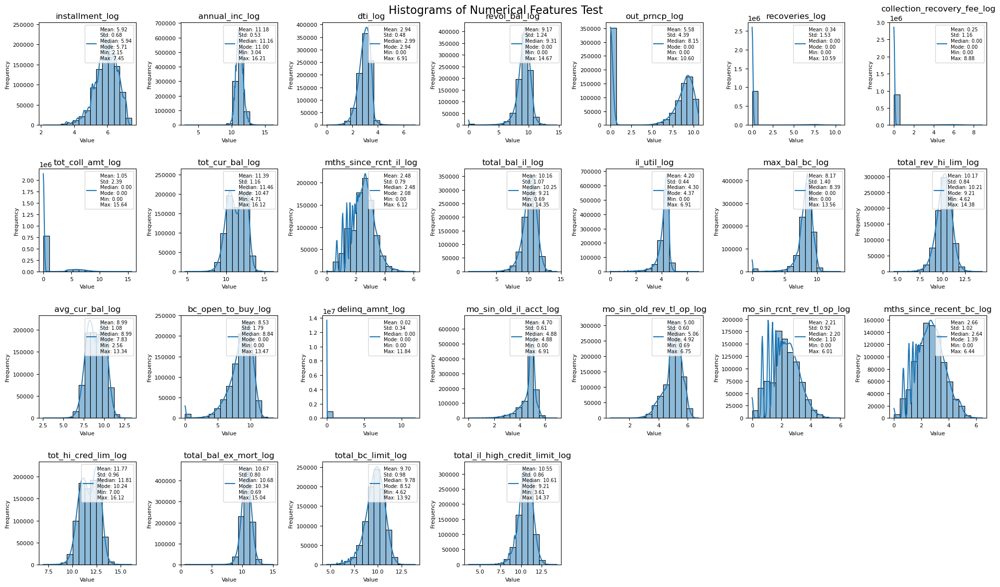

In [39]:
# Get Numerical Features
log_features = missing_values_under_50.iloc[:, -25:].columns

num_cols = len(log_features)
num_rows = int((num_cols + 2) // 6)
print(num_cols, num_rows)

fig, axes = plt.subplots(num_rows,7, figsize=(20, num_rows * 3))

fig.suptitle('Histograms of Numerical Features Test', fontsize=16)
for i, col in enumerate(log_features):
    ax = axes[i //7, i %7]
    sns.histplot(missing_values_under_50[col], bins=15, kde=True, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value', fontsize=8)
    ax.set_ylabel('Frequency', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    
    # Menghitung statistik
    mean = missing_values_under_50[col].mean()
    std = missing_values_under_50[col].std()
    median = missing_values_under_50[col].median()
    mode_series = missing_values_under_50[col].mode()
    mode = mode_series.iloc[0] if not mode_series.empty else np.nan
    min_val = missing_values_under_50[col].min()
    max_val = missing_values_under_50[col].max()
    
    # Menambahkan statistik ke dalam legenda
    stats_text = (f'Mean: {mean:.2f}\n'
                  f'Std: {std:.2f}\n'
                  f'Median: {median:.2f}\n'
                  f'Mode: {mode:.2f}\n'
                  f'Min: {min_val:.2f}\n'
                  f'Max: {max_val:.2f}')
    
    # Menampilkan legenda
    ax.legend([stats_text], loc='upper right', fontsize=7)

# Delete unuseful subplot
for i in range(num_cols, num_rows *7):
    fig.delaxes(axes.flatten()[i])

# Adjust layout subplot
plt.tight_layout()
plt.subplots_adjust(top=0.95)

plt.show()


68 10


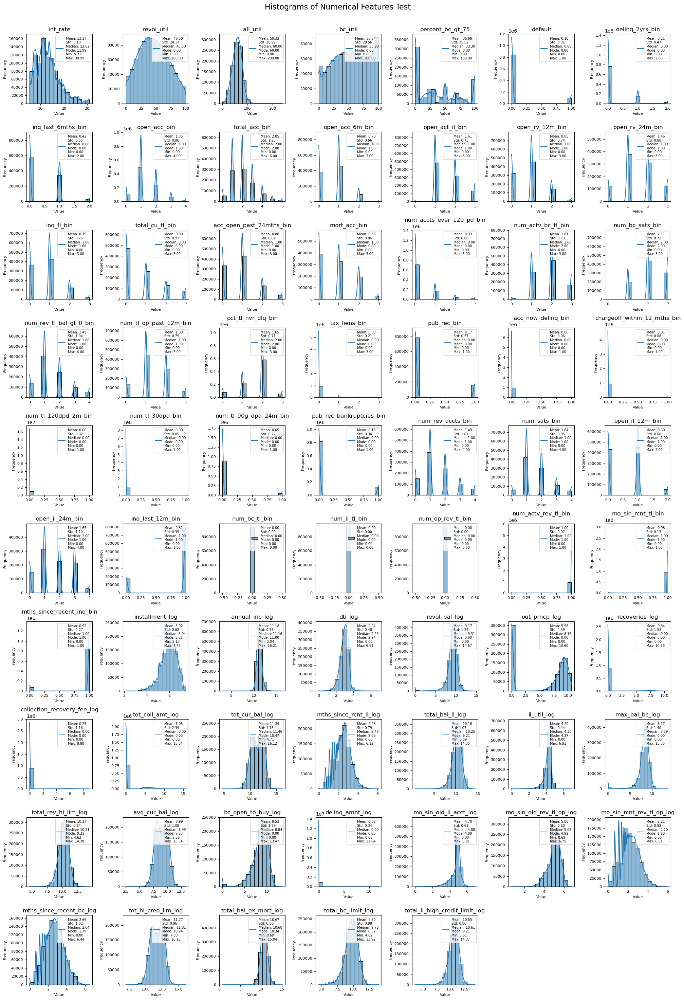

,int_rate,grade,emp_length,home_ownership,verification_status,issue_d,pymnt_plan,purpose,earliest_cr_line,revol_util,...,bc_open_to_buy_log,delinq_amnt_log,mo_sin_old_il_acct_log,mo_sin_old_rev_tl_op_log,mo_sin_rcnt_rev_tl_op_log,mths_since_recent_bc_log,tot_hi_cred_lim_log,total_bal_ex_mort_log,total_bc_limit_log,total_il_high_credit_limit_log
0,13.56,C,10+ years,RENT,Not Verified,Dec-2018,n,debt_consolidation,Apr-2001,10.3,...,10.444677,0.0,4.948760,5.361292,0.693147,0.693147,11.004181,9.735187,10.505095,9.805047
1,18.94,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Jun-1987,24.2,...,9.529666,0.0,5.099866,5.937536,1.609438,1.609438,12.828993,11.507601,9.615872,11.451826
2,17.97,D,6 years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Apr-2011,19.1,...,9.532496,0.0,4.477337,4.532599,2.772589,4.356709,11.827211,9.371609,9.532496,9.210440
3,18.94,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Feb-2006,78.1,...,7.122867,0.0,4.143135,5.043425,4.174387,4.174387,12.861476,10.495488,8.517393,10.714084
4,16.14,C,10+ years,MORTGAGE,Not Verified,Dec-2018,n,debt_consolidation,Dec-2000,3.6,...,9.044522,0.0,3.988984,5.379897,1.098612,1.098612,11.967492,10.298060,9.137877,10.383844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260658,16.02,C,< 1 year,RENT,Verified,Oct-2017,n,debt_consolidation,Mar-2001,24.8,...,9.768698,0.0,5.257495,5.293305,0.000000,1.098612,12.496033,12.384562,10.038936,12.384533
2260662,30.75,F,6 years,MORTGAGE,Verified,Oct-2017,n,debt_consolidation,Aug-1996,66.9,...,8.845489,0.0,3.637586,5.537334,1.945910,3.295837,12.212487,11.137228,9.711176,11.067997
2260663,14.08,C,10+ years,MORTGAGE,Not Verified,Oct-2017,n,debt_consolidation,Jan-2004,39.2,...,7.499977,0.0,5.062595,5.105945,0.693147,2.302585,11.211131,10.719140,8.732466,10.808697
2260664,25.82,E,< 1 year,MORTGAGE,Not Verified,Oct-2017,n,debt_consolidation,Mar-2003,20.2,...,9.122929,0.0,5.099866,5.164786,2.833213,4.955827,12.853898,9.467228,9.341456,9.403107


In [40]:
# Get Numerical Features
num_features = missing_values_under_50.select_dtypes(include=['int', 'float']).columns

num_cols = len(num_features)
num_rows = int((num_cols + 2) // 7)
print(num_cols, num_rows)

fig, axes = plt.subplots(num_rows,7, figsize=(20, num_rows * 3))

fig.suptitle('Histograms of Numerical Features Test', fontsize=16)
for i, col in enumerate(num_features):
    ax = axes[i //7, i %7]
    sns.histplot(missing_values_under_50[col], bins=15, kde=True, ax=ax)
    # sns.countplot(x=col, data=missing_values_under_50_exp, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('Value', fontsize=8)
    ax.set_ylabel('Frequency', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    
    # Menghitung statistik
    mean = missing_values_under_50[col].mean()
    std = missing_values_under_50[col].std()
    median = missing_values_under_50[col].median()
    mode_series = missing_values_under_50[col].mode()
    mode = mode_series.iloc[0] if not mode_series.empty else np.nan
    min_val = missing_values_under_50[col].min()
    max_val = missing_values_under_50[col].max()
    
    # Menambahkan statistik ke dalam legenda
    stats_text = (f'Mean: {mean:.2f}\n'
                  f'Std: {std:.2f}\n'
                  f'Median: {median:.2f}\n'
                  f'Mode: {mode:.2f}\n'
                  f'Min: {min_val:.2f}\n'
                  f'Max: {max_val:.2f}')
    
    # Menampilkan legenda
    ax.legend([stats_text], loc='upper right', fontsize=7)

    # for p in ax.patches:
    #     ax.annotate(f"{p.get_height():.0f}", (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 2), fontsize=7, ha='center', va='center', textcoords='offset points')
    #     ax.annotate(f"{(p.get_height() / len(missing_values_under_50) * 100):.2f}%", (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(-1, 10), fontsize=7, ha='center', va='center', textcoords='offset points')

# Menghapus subplot yang tidak terpakai
for i in range(num_cols, num_rows *7):
    fig.delaxes(axes.flatten()[i])

# Menyesuaikan layout subplot
plt.tight_layout()
plt.subplots_adjust(top=0.95)

# Menampilkan plot
plt.show()

missing_values_under_50

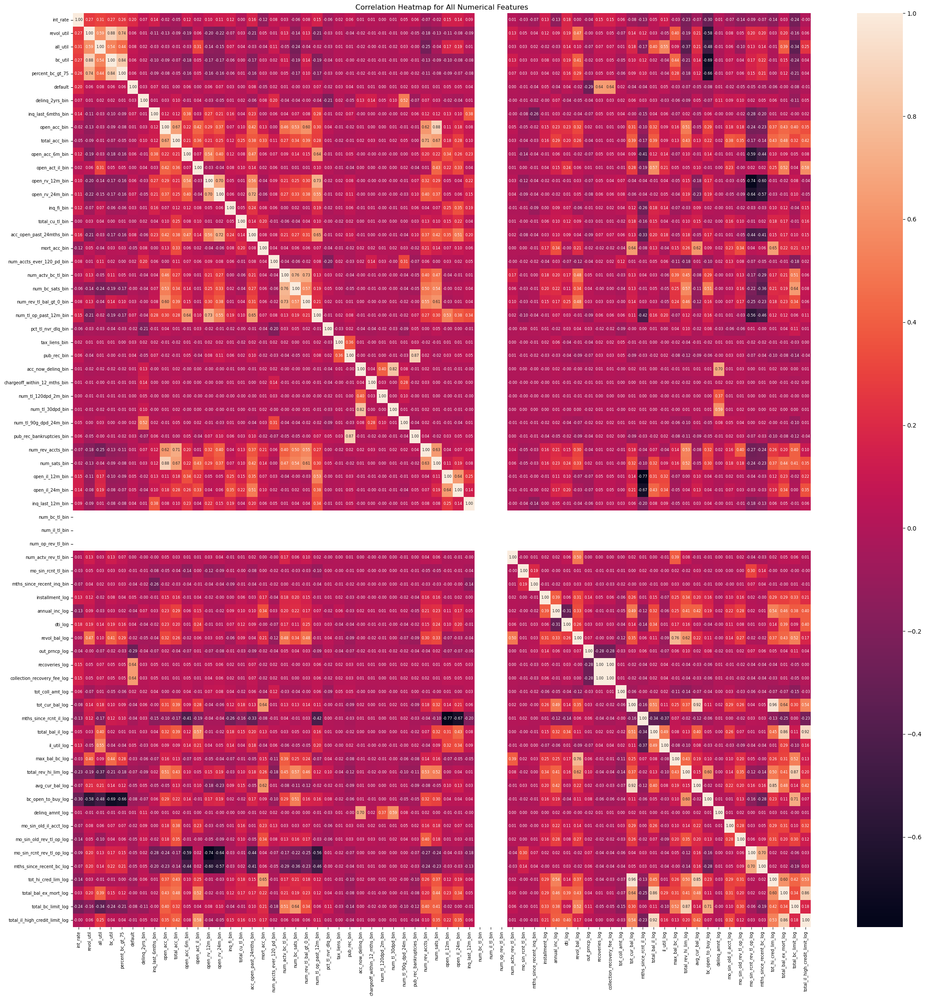

In [41]:
# CORRELATION BEETWEN NUMERIC COLUMNS
corr = missing_values_under_50[num_features].corr()
corr
plt.figure(figsize=(23, 23))

sns.heatmap(corr, annot=True, fmt='.2f', annot_kws={"fontsize": 6})
plt.title('Correlation Heatmap for All Numerical Features')
plt.tick_params(axis='both', labelsize=7)
plt.tick_params(axis='x', rotation=90)

# Show the plot
plt.tight_layout()
plt.show()

In [42]:
# Sorting the correlation result
corr_sort = corr['default'].sort_values(ascending=False).to_frame().reset_index()

# The feature have correlation more than 0.04 and less than 0.04
filter_corr = corr_sort[(corr_sort['default'] > 0.04) | (corr_sort['default'] < 0.04)]
filter_corr

,index,default
0,default,1.000000
1,recoveries_log,0.642746
2,collection_recovery_fee_log,0.637210
3,int_rate,0.199475
4,all_util,0.083853
...,...,...
60,tot_hi_cred_lim_log,-0.064431
61,total_rev_hi_lim_log,-0.071316
62,total_bc_limit_log,-0.079154
63,bc_open_to_buy_log,-0.081758


In [43]:
missing_values_under_50.select_dtypes(include='object')

,grade,emp_length,home_ownership,verification_status,issue_d,pymnt_plan,purpose,earliest_cr_line,hardship_flag
0,C,10+ years,RENT,Not Verified,Dec-2018,n,debt_consolidation,Apr-2001,N
1,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Jun-1987,N
2,D,6 years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Apr-2011,N
3,D,10+ years,MORTGAGE,Source Verified,Dec-2018,n,debt_consolidation,Feb-2006,N
4,C,10+ years,MORTGAGE,Not Verified,Dec-2018,n,debt_consolidation,Dec-2000,N
...,...,...,...,...,...,...,...,...,...
2260658,C,< 1 year,RENT,Verified,Oct-2017,n,debt_consolidation,Mar-2001,N
2260662,F,6 years,MORTGAGE,Verified,Oct-2017,n,debt_consolidation,Aug-1996,N
2260663,C,10+ years,MORTGAGE,Not Verified,Oct-2017,n,debt_consolidation,Jan-2004,N
2260664,E,< 1 year,MORTGAGE,Not Verified,Oct-2017,n,debt_consolidation,Mar-2003,N


In [44]:
# Delete issue_d and earliest_cr_line 
missing_values_under_50.drop(columns=['issue_d', 'earliest_cr_line'], inplace=True)


In [45]:
# Encoding dataset
df_dummies = pd.get_dummies(missing_values_under_50.select_dtypes(include='object'))

# Drop the type object column was transformation
drop_dummies = missing_values_under_50.drop(missing_values_under_50.select_dtypes(include='object'), axis=1)
df_dummies = pd.concat([drop_dummies, df_dummies], axis=1)

# convert bool columns to int
bool_type = df_dummies.select_dtypes(include='bool').columns
df_dummies[bool_type] = df_dummies[bool_type].astype(int)

df_dummies

,int_rate,revol_util,all_util,bc_util,percent_bc_gt_75,default,delinq_2yrs_bin,inq_last_6mths_bin,open_acc_bin,total_acc_bin,...,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,hardship_flag_N,hardship_flag_Y
0,13.56,10.3,28.0,5.9,0.0,0,0,1,1.0,3.0,...,0,0,0,0,0,0,0,0,1,0
1,18.94,24.2,57.0,8.3,0.0,0,0,0,1.0,4.0,...,0,0,0,0,0,0,0,0,1,0
2,17.97,19.1,35.0,0.0,0.0,0,0,0,1.0,1.0,...,0,0,0,0,0,0,0,0,1,0
3,18.94,78.1,70.0,75.2,100.0,0,0,0,1.0,1.0,...,0,0,0,0,0,0,0,0,1,0
4,16.14,3.6,54.0,8.9,0.0,0,0,0,1.0,2.0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260658,16.02,24.8,52.0,23.7,0.0,0,0,2,2.0,6.0,...,0,0,0,0,0,0,0,0,1,0
2260662,30.75,66.9,74.0,57.9,50.0,0,0,1,1.0,1.0,...,0,0,0,0,0,0,0,0,1,0
2260663,14.08,39.2,38.0,70.9,66.7,0,0,0,1.0,3.0,...,0,0,0,0,0,0,0,0,1,0
2260664,25.82,20.2,44.0,19.6,50.0,0,2,1,1.0,2.0,...,0,0,0,0,0,0,0,0,1,0


#### Feature Selection

In [46]:
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier

np.int = np.int32
np.float = np.float64
np.bool = np.bool_

# Computer Spearman's rank correlation
correlations = df_dummies.corr(method='spearman')
target_corr = correlations['default'].drop('default')
print("Spearman's rank correlation with target:\n", target_corr)

# Pre-select features with correlation above threshold
threshold = 0.04
selected_features = target_corr[abs(target_corr) >=threshold].index.tolist()
print("Pre-selected features based on Spearman's correlation:\n", selected_features)

# Prepare data for Boruta
X = df_dummies[selected_features].values
y = df_dummies['default'].values

# Initialize and fit boruta
forest = RandomForestClassifier(n_jobs=-1, class_weight='balanced', max_depth=5)
boruta = BorutaPy(forest, n_estimators='auto', random_state=42)
boruta.fit(np.array(X), np.array(y))

# Get the result
features = np.array(selected_features)
print("Features confirmed by Boruta:\n", features[boruta.support_])
print("Features reject by Boruta:\n", features[~boruta.support_])
print("Features deemed tentative by Boruta:\n", features[boruta.support_weak_])

Spearman's rank correlation with target:
 int_rate                  0.191638
revol_util                0.056225
all_util                  0.085764
bc_util                   0.060566
percent_bc_gt_75          0.062523
                            ...   
purpose_small_business    0.021477
purpose_vacation          0.001045
purpose_wedding          -0.000706
hardship_flag_N          -0.070245
hardship_flag_Y           0.070245
Name: default, Length: 111, dtype: float64
Pre-selected features based on Spearman's correlation:
 ['int_rate', 'revol_util', 'all_util', 'bc_util', 'percent_bc_gt_75', 'inq_last_6mths_bin', 'open_acc_6m_bin', 'open_rv_12m_bin', 'open_rv_24m_bin', 'acc_open_past_24mths_bin', 'mort_acc_bin', 'num_tl_op_past_12m_bin', 'pub_rec_bin', 'open_il_12m_bin', 'open_il_24m_bin', 'inq_last_12m_bin', 'installment_log', 'annual_inc_log', 'dti_log', 'out_prncp_log', 'recoveries_log', 'collection_recovery_fee_log', 'tot_cur_bal_log', 'mths_since_rcnt_il_log', 'il_util_log', 'max_bal

In [47]:
# Feature confirmed
print("Total of Features confirmed by Boruta:\n", len(features[boruta.support_]))
print("Features confirmed by Boruta:\n", features[boruta.support_])


Total of Features confirmed by Boruta:
 48
Features confirmed by Boruta:
 ['int_rate' 'revol_util' 'all_util' 'bc_util' 'percent_bc_gt_75'
 'inq_last_6mths_bin' 'open_acc_6m_bin' 'open_rv_12m_bin'
 'open_rv_24m_bin' 'acc_open_past_24mths_bin' 'mort_acc_bin'
 'num_tl_op_past_12m_bin' 'pub_rec_bin' 'open_il_12m_bin'
 'open_il_24m_bin' 'inq_last_12m_bin' 'installment_log' 'annual_inc_log'
 'dti_log' 'out_prncp_log' 'recoveries_log' 'collection_recovery_fee_log'
 'tot_cur_bal_log' 'mths_since_rcnt_il_log' 'il_util_log' 'max_bal_bc_log'
 'total_rev_hi_lim_log' 'avg_cur_bal_log' 'bc_open_to_buy_log'
 'mo_sin_old_rev_tl_op_log' 'mo_sin_rcnt_rev_tl_op_log'
 'mths_since_recent_bc_log' 'tot_hi_cred_lim_log' 'total_bc_limit_log'
 'grade_A' 'grade_B' 'grade_D' 'grade_E' 'grade_F' 'grade_G'
 'home_ownership_MORTGAGE' 'home_ownership_RENT'
 'verification_status_Not Verified' 'verification_status_Verified'
 'pymnt_plan_n' 'pymnt_plan_y' 'hardship_flag_N' 'hardship_flag_Y']


In [48]:
# Throw target column into feature was confirmed
target = df_dummies[['default']]
features_confirmed = df_dummies[features[boruta.support_]]
df_loan = pd.concat([features_confirmed, target], axis=1)
df_loan.reset_index(drop=True)
df_loan

,int_rate,revol_util,all_util,bc_util,percent_bc_gt_75,inq_last_6mths_bin,open_acc_6m_bin,open_rv_12m_bin,open_rv_24m_bin,acc_open_past_24mths_bin,...,grade_G,home_ownership_MORTGAGE,home_ownership_RENT,verification_status_Not Verified,verification_status_Verified,pymnt_plan_n,pymnt_plan_y,hardship_flag_N,hardship_flag_Y,default
0,13.56,10.3,28.0,5.9,0.0,1,1,1,3,2,...,0,0,1,1,0,1,0,1,0,0
1,18.94,24.2,57.0,8.3,0.0,0,2,2,2,2,...,0,1,0,0,0,1,0,1,0,0
2,17.97,19.1,35.0,0.0,0.0,0,0,0,1,1,...,0,1,0,0,0,1,0,1,0,0
3,18.94,78.1,70.0,75.2,100.0,0,1,0,0,1,...,0,1,0,0,0,1,0,1,0,0
4,16.14,3.6,54.0,8.9,0.0,0,2,1,2,2,...,0,1,0,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260658,16.02,24.8,52.0,23.7,0.0,2,2,2,3,3,...,0,0,1,0,1,1,0,1,0,0
2260662,30.75,66.9,74.0,57.9,50.0,1,1,1,2,1,...,0,1,0,0,1,1,0,1,0,0
2260663,14.08,39.2,38.0,70.9,66.7,0,1,2,2,1,...,0,1,0,1,0,1,0,1,0,0
2260664,25.82,20.2,44.0,19.6,50.0,1,0,0,2,1,...,0,1,0,1,0,1,0,1,0,0


#### Modelling


In [49]:
from sklearn.model_selection import StratifiedShuffleSplit

# Split data
X = df_loan.drop('default', axis=1)
y = df_loan['default']

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [50]:
print(f"Shape of training features: {X_train.shape}")
print(f"Shape of testing features: {X_test.shape}")
print(f"Shape of training features target: {y_train.shape}")
print(f"Shape of testing features target: {y_test.shape}")

Shape of training features: (753257, 48)
Shape of testing features: (188315, 48)
Shape of training features target: (753257,)
Shape of testing features target: (188315,)


In [51]:
# Standardization
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [52]:
# Balanced data using SMOTE method
smote = SMOTE(random_state=42)

X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [53]:
y_train_resampled.value_counts()

default
0    674201
1    674201
Name: count, dtype: int64

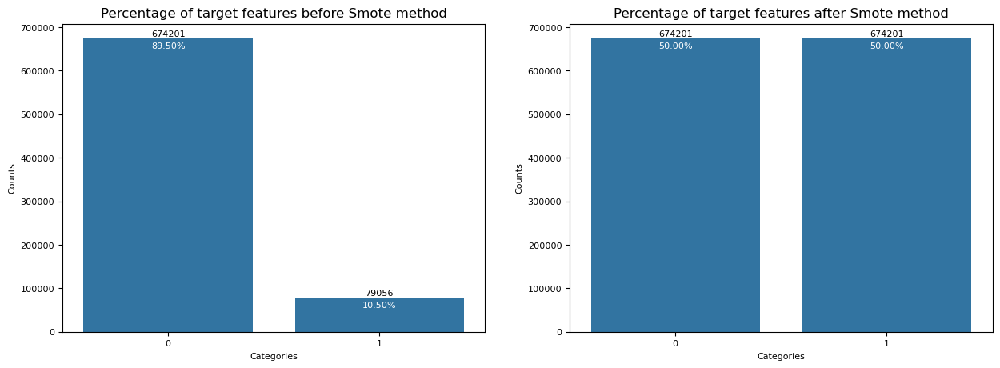

<Figure size 800x600 with 0 Axes>

In [54]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Percentage of target features before Smote method
sns.countplot(x=y_train, ax=ax[0])
ax[0].set_title('Percentage of target features before Smote method')
ax[0].set_xlabel('Categories', fontsize=8)
ax[0].set_ylabel('Counts', fontsize=8)
ax[0].tick_params(axis='both', labelsize=8)

for p in ax[0].patches:
    ax[0].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), fontsize=8, ha='center', textcoords='offset points')
    ax[0].annotate(f'{(p.get_height() / len(y_train)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, -9), fontsize=8, ha='center', color='white', textcoords='offset points')

# Percentage of target features after Smote method
plt.figure(figsize=(8, 6))
sns.countplot(x=y_train_resampled, ax=ax[1])
ax[1].set_title('Percentage of target features after Smote method')
ax[1].set_xlabel('Categories', fontsize=8)
ax[1].set_ylabel('Counts', fontsize=8)
ax[1].tick_params(axis='both', labelsize=8)

for p in ax[1].patches:
    ax[1].annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), fontsize=8, ha='center', textcoords='offset points')
    ax[1].annotate(f'{(p.get_height() / len(y_train_resampled)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, -9), fontsize=8, ha='center', color='white', textcoords='offset points')

plt.tight_layout()
plt.show()

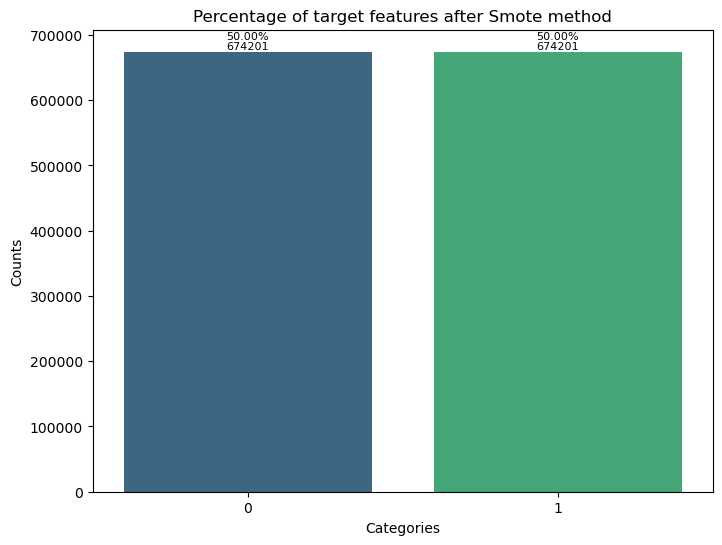

In [55]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x=y_train_resampled, palette="viridis")
plt.title('Percentage of target features after Smote method')
plt.xlabel('Categories')
plt.ylabel('Counts')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), fontsize=8, ha='center', textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(y_train_resampled)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 9), fontsize=8, ha='center', textcoords='offset points')

plt.show()

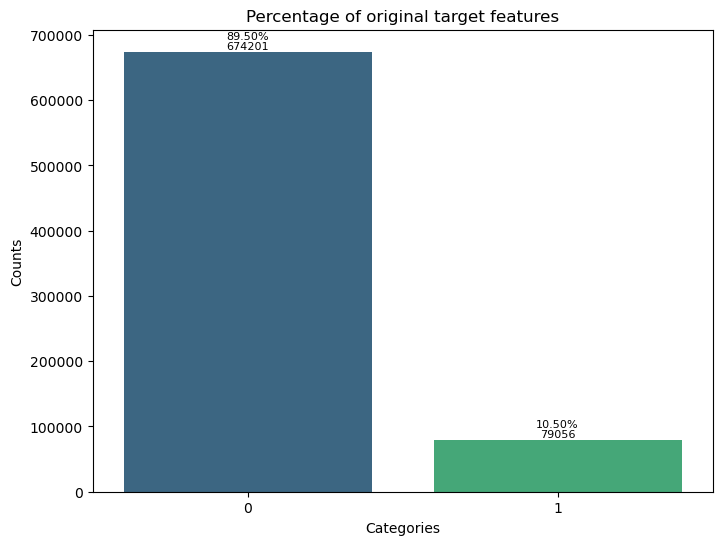

In [56]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x=y_train, palette="viridis")
plt.title('Percentage of original target features')
plt.xlabel('Categories')
plt.ylabel('Counts')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 2), fontsize=8, ha='center', textcoords='offset points')
    ax.annotate(f'{(p.get_height() / len(y_train)) * 100:.2f}%', (p.get_x() + p.get_width() / 2, p.get_height()), xytext=(0, 9), fontsize=8, ha='center', textcoords='offset points')

plt.show()

In [57]:
# Algorithm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, confusion_matrix
import pandas as pd

# Model
lr_clf = LogisticRegression()
svm_clf = LinearSVC()
dt_clf = DecisionTreeClassifier()
rfc_clf = RandomForestClassifier()
gb_clf = GradientBoostingClassifier()
xgb_clf = XGBClassifier()

# Models
models = [lr_clf, svm_clf, dt_clf, rfc_clf, gb_clf, xgb_clf]

accuracy_score_ = [] 
train_score_ = []
test_score_ = []
precision_score_ = []
recall_score_ = []

for model in models:
    # Prediksi dan evaluasi model
    predict = model.fit(X_train_resampled, y_train_resampled).predict(X_test)

    # Evaluasi
    print(str(model))
    print(classification_report(y_test, predict))
    print(f"Accuracy Score: {accuracy_score(y_test, predict)}")
    print(f"Training Score: {model.score(X_train_resampled, y_train_resampled)}")
    print(f"Test Score: {model.score(X_test, y_test)}")
    print(f"Precision Score: {precision_score(y_test, predict)}")
    print(f"Recall Score: {recall_score(y_test, predict)}")
    print(f"Confusion Matrix: \n{confusion_matrix(y_test, predict)} \n\n Accuracy Score: {accuracy_score(y_test, predict)}")
    print("\n\n")
    
    accuracy_score_.append(accuracy_score(y_test, predict))
    train_score_.append(model.score(X_train_resampled, y_train_resampled))
    test_score_.append(model.score(X_test, y_test))
    precision_score_.append(precision_score(y_test, predict))
    recall_score_.append(recall_score(y_test, predict))

# Simpan skor ke dalam DataFrame
df_scores = pd.DataFrame({
    'Model': ['Logistic Regression', 'Linear SVM', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'XG Boost'],
    'Accuracy Score': accuracy_score_,
    'Training Score': train_score_,
    'Test Score': test_score_,
    'Precision Score': precision_score_,
    'Recall Score': recall_score_
})



LogisticRegression()
              precision    recall  f1-score   support

           0       0.96      0.86      0.90    168551
           1       0.36      0.69      0.47     19764

    accuracy                           0.84    188315
   macro avg       0.66      0.78      0.69    188315
weighted avg       0.90      0.84      0.86    188315

Accuracy Score: 0.838520563948703
Training Score: 0.7823475491730211
Test Score: 0.838520563948703
Precision Score: 0.3603421584319488
Recall Score: 0.6948492208055049
Confusion Matrix: 
[[144173  24378]
 [  6031  13733]] 

 Accuracy Score: 0.838520563948703



LinearSVC()
              precision    recall  f1-score   support

           0       0.96      0.86      0.91    168551
           1       0.37      0.69      0.48     19764

    accuracy                           0.84    188315
   macro avg       0.66      0.78      0.69    188315
weighted avg       0.90      0.84      0.86    188315

Accuracy Score: 0.8413827894750816
Training Score: 

In [58]:
df_scores

,Model,Accuracy Score,Training Score,Test Score,Precision Score,Recall Score
0,Logistic Regression,0.838521,0.782348,0.838521,0.360342,0.694849
1,Linear SVM,0.841383,0.782038,0.841383,0.365052,0.691611
2,Decision Tree,0.874710,1.000000,0.874710,0.424206,0.542299
3,Random Forest,0.940446,1.000000,0.940446,0.941717,0.461091
4,Gradient Boosting,0.927897,0.920014,0.927897,0.722614,0.507994
5,XG Boost,0.942033,0.964556,0.942033,0.987225,0.453552


Terlihat bahwa sepertinya model mengalami overfitting

In [59]:
from sklearn.base import clone

# Cross Validation
skfolds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in skfolds.split(X_train_resampled, y_train_resampled):
    clone_lr_clf = clone(lr_clf)
    clone_svm_clf = clone(svm_clf)
    clone_dt_clf = clone(dt_clf)
    clone_rf_clf = clone(rfc_clf)
    clone_gb_clf = clone(gb_clf)
    clone_xgb_clf = clone(xgb_clf)
    
    X_train_folds, X_test_folds = X_train_resampled[train_index], X_train_resampled[test_index]
    y_train_folds, y_test_folds = y_train_resampled[train_index], y_train_resampled[test_index]

In [60]:
# Info
print(len(X_train_resampled), len(y_train_resampled))
print(len(X_train_folds), len(y_train_folds))

1348402 1348402
1078722 1078722


In [61]:
# Algorithm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, confusion_matrix
import pandas as pd


# Models cross validation
models = [clone_lr_clf, clone_svm_clf, clone_dt_clf, clone_rf_clf, clone_gb_clf, clone_xgb_clf]

accuracy_score_ = [] 
train_score_ = []
test_score_ = []
precision_score_ = []
recall_score_ = []

for model in models:
    # Prediksi dan evaluasi model
    predict = model.fit(X_train_folds, y_train_folds).predict(X_test_folds)

    # Evaluasi
    print(str(model))
    print(classification_report(y_test_folds, predict))
    print(f"Accuracy Score: {accuracy_score(y_test_folds, predict)}")
    print(f"Training Score: {model.score(X_train_folds, y_train_folds)}")
    print(f"Test Score: {model.score(X_test_folds, y_test_folds)}")
    print(f"Precision Score: {precision_score(y_test_folds, predict)}")
    print(f"Recall Score: {recall_score(y_test_folds, predict)}")
    print(f"Confusion Matrix: \n{confusion_matrix(y_test_folds, predict)} \n\n Accuracy Score: {accuracy_score(y_test_folds, predict)}")
    print("\n\n")
    
    accuracy_score_.append(accuracy_score(y_test_folds, predict))
    train_score_.append(model.score(X_train_folds, y_train_folds))
    test_score_.append(model.score(X_test_folds, y_test_folds))
    precision_score_.append(precision_score(y_test_folds, predict))
    recall_score_.append(recall_score(y_test_folds, predict))

# Simpan skor ke dalam DataFrame
df_scores = pd.DataFrame({
    'Model': ['Logistic Regression', 'Linear SVM', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'XG Boost'],
    'Accuracy Score': accuracy_score_,
    'Training Score': train_score_,
    'Test Score': test_score_,
    'Precision Score': precision_score_,
    'Recall Score': recall_score_
})



LogisticRegression()
              precision    recall  f1-score   support

           0       0.75      0.85      0.80    134840
           1       0.83      0.71      0.77    134840

    accuracy                           0.78    269680
   macro avg       0.79      0.78      0.78    269680
weighted avg       0.79      0.78      0.78    269680

Accuracy Score: 0.7837251557401365
Training Score: 0.7820476452691241
Test Score: 0.7837251557401365
Precision Score: 0.8300194091007117
Recall Score: 0.7135864728567191
Confusion Matrix: 
[[115135  19705]
 [ 38620  96220]] 

 Accuracy Score: 0.7837251557401365



LinearSVC()
              precision    recall  f1-score   support

           0       0.75      0.86      0.80    134840
           1       0.83      0.71      0.77    134840

    accuracy                           0.78    269680
   macro avg       0.79      0.78      0.78    269680
weighted avg       0.79      0.78      0.78    269680

Accuracy Score: 0.7832319786413527
Training Scor

In [62]:
df_scores

,Model,Accuracy Score,Training Score,Test Score,Precision Score,Recall Score
0,Logistic Regression,0.783725,0.782048,0.783725,0.830019,0.713586
1,Linear SVM,0.783232,0.781694,0.783232,0.832674,0.708922
2,Decision Tree,0.920157,1.000000,0.920157,0.911760,0.930354
3,Random Forest,0.970328,1.000000,0.970328,0.994889,0.945513
4,Gradient Boosting,0.922619,0.922896,0.922619,0.977342,0.865300
5,XG Boost,0.964295,0.964399,0.964295,0.999107,0.929420


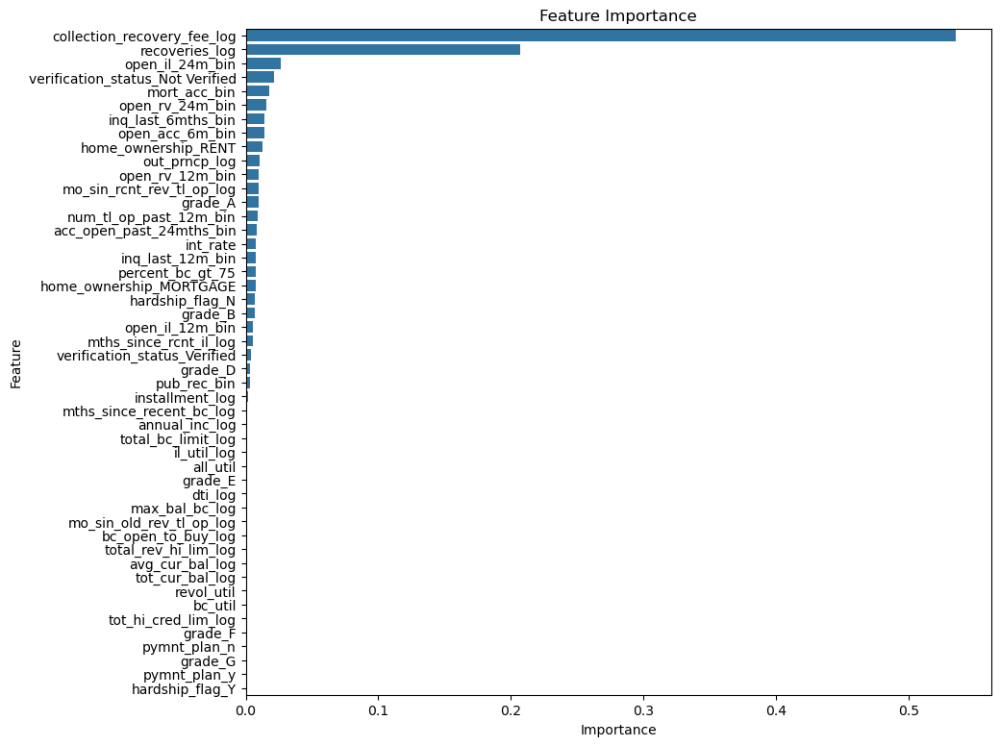

In [63]:
# Select features
selected_features = X.columns[boruta.support_]
X_selected = X[selected_features]

# Get feature importances
importances = model.feature_importances_
feature_names = X_selected.columns
feature_names

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 9))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

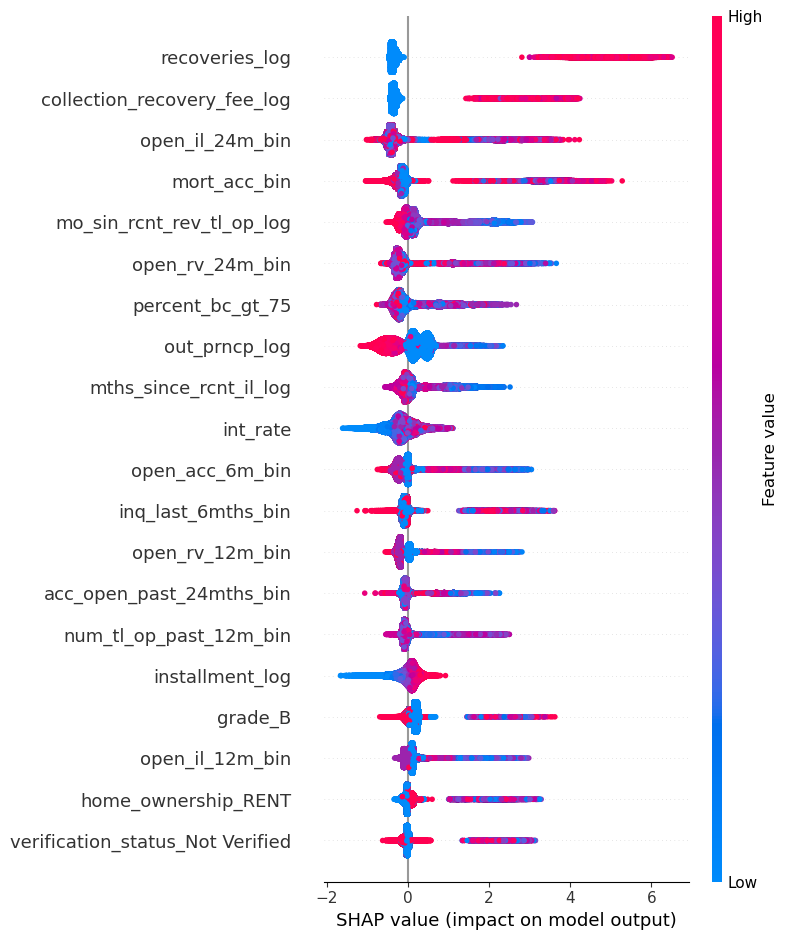

In [109]:
# HASP Plot
import shap

# Create a SHAP explainer
explainer = shap.Explainer(model)
shap_values = explainer(X_test_folds)

# SHAP summary plot
plt.figure()
shap.summary_plot(shap_values, X_test_folds, feature_names=df_loan.columns)
plt.show()

# SHAP dependence plot for a single feature
# plt.figure()
# shap.dependence_plot("loan_status", shap_values.values, X_test_folds, feature_names=df_loan.columns)
# plt.show()

# # SHAP force plot for a single prediction
# shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values.values[0,:], X_test_folds[0,:], feature_names=df_loan.columns)

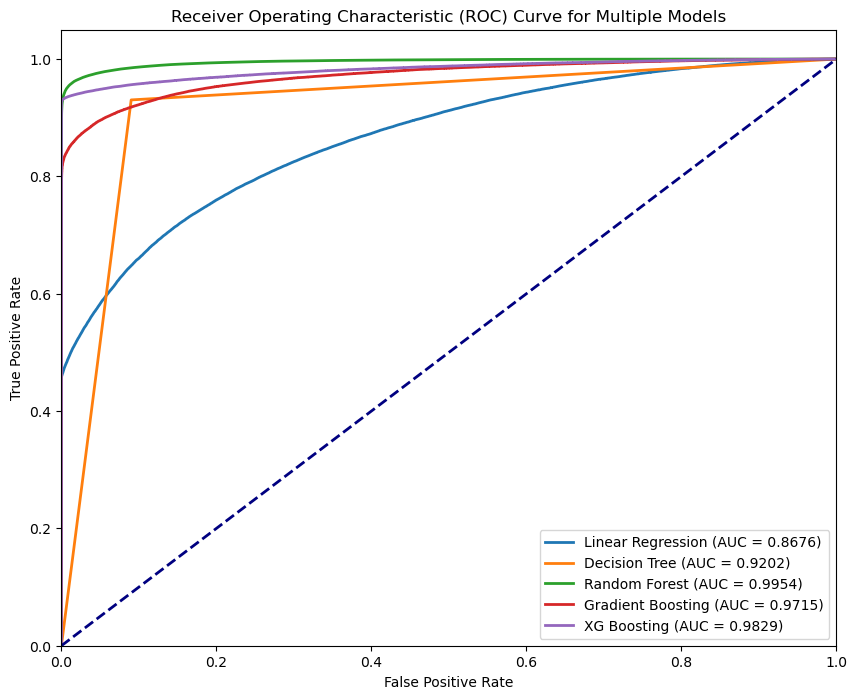

In [64]:
plt.figure(figsize=(10, 8))

models = {
    'Linear Regression': clone_lr_clf,
    'Decision Tree': clone_dt_clf,
    'Random Forest': clone_rf_clf,
    'Gradient Boosting': clone_gb_clf,
    'XG Boosting': clone_xgb_clf,
}

for model_name, model in models.items():
    # Predict probabilities
    y_probs = model.predict_proba(X_test_folds)[:, 1]
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(y_test_folds, y_probs)
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')

# Plot diagonal line for reference
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Plot settings
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiple Models')
plt.legend(loc="lower right")
plt.show()


In [51]:
for model in models:
    # Prediksi dan evaluasi model
    predict = model.fit(X_train_folds, y_train_folds).predict(X_test_folds)

    print(f"F1 Score of {model}: {f1_score(y_test_folds, predict)}")

F1 Score of LogisticRegression(): 0.7674117201363827
F1 Score of LinearSVC(): 0.7658307963467393
F1 Score of DecisionTreeClassifier(): 0.9206078973824602
F1 Score of RandomForestClassifier(): 0.9696303453102771
F1 Score of GradientBoostingClassifier(): 0.9179142639110699
F1 Score of XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_pa

In [48]:
# models
models = [clone_lr_clf, clone_svm_clf, clone_dt_clf, clone_rf_clf, clone_gb_clf, clone_xgb_clf]
model_names =  ['Logistic Regression', 'Linear SVM', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'XG Boost'],

# Create variable for set row and column
num_cols = len(models)
num_rows = (num_cols + 2) // 3
print(num_cols, num_rows)

6 2


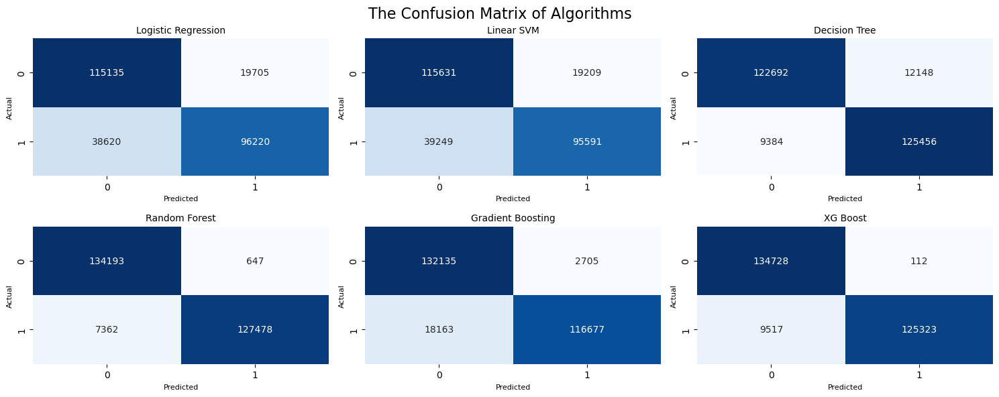

In [53]:
# Models and their names
models = [clone_lr_clf, clone_svm_clf, clone_dt_clf, clone_rf_clf, clone_gb_clf, clone_xgb_clf]
model_names = ['Logistic Regression', 'Linear SVM', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'XG Boost']

# Create variable for set row and column
num_cols = 3
num_rows = (len(models) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))
fig.suptitle('The Confusion Matrix of Algorithms', fontsize=16)

for i, (model, name) in enumerate(zip(models, model_names)):
    ax = axes[i // num_cols, i % num_cols]
    # Predict
    predict = model.fit(X_train_folds, y_train_folds).predict(X_test_folds)
    # Generate a confusion matrix
    cm = confusion_matrix(y_test_folds, predict)

    # Create a heatmap for the confusion matrix
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax)
    ax.set_xlabel('Predicted', fontsize=8)
    ax.set_ylabel('Actual', fontsize=8)
    ax.set_title(f'{name}', fontsize=10)

# Removed unnecessary subplots
for i in range(len(models), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])
    
plt.tight_layout()
plt.subplots_adjust(top=0.9)

plt.show()

#### FINE TUNE

In [69]:
# RANDOMIZED SEARCH CV

# Logistic Regression
param_distributions_lr = {
    'penalty': ['l1', 'l2', 'elasticnet', 'None'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'l1_ratio': np.linspace(0, 1, 20)  # Only used for elasticnet penalty
}

# Random Forest
param_distributions_rf = {
    'n_estimators': [50, 100, 200, 500],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Decision Tree
param_distributions_dt = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

# Gradient Boosting
param_distributions_gb = {
    'n_estimators': [50, 100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.05, 0.001],
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 2, 4, 8],
    'max_features': ['auto', 'sqrt', 'log2'],
    'subsample': [0.6, 0.8, 1.0]
}

# XG Boosting
param_distributions_xgb = {
    'n_estimators': [50, 100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.05, 0.001],
    'max_depth': [3, 5, 7, 10],
    'min_child_weight': [1, 3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3, 0.4],
    'reg_alpha': [0, 0.1, 0.5, 1],
    'reg_lambda': [1, 1.5, 2, 3]
}


In [70]:
from sklearn.model_selection import RandomizedSearchCV

# Linear Regression with Ridge
lr = LogisticRegression(max_iter=10000)
random_search_lr = RandomizedSearchCV(estimator=lr, param_distributions=param_distributions_lr, n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Decision Tree
dt = DecisionTreeClassifier()
random_search_dt = RandomizedSearchCV(estimator=dt, param_distributions=param_distributions_dt, n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Random Forest
rf = RandomForestClassifier()
random_search_rf = RandomizedSearchCV(estimator=rf, param_distributions=param_distributions_rf, n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)

# Gradient Boosting
gb = GradientBoostingClassifier()
random_search_gb = RandomizedSearchCV(estimator=gb, param_distributions=param_distributions_gb, n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)

# XGBoosting
xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
random_search_xgb = RandomizedSearchCV(estimator=xgb, param_distributions=param_distributions_xgb, n_iter=50, cv=5, verbose=2, random_state=42, n_jobs=-1)


In [71]:
# Random Forest
random_search_rf.fit(X_train_folds, y_train_folds)
print("Best parameters for Random Forest: ", random_search_rf.best_params_)
print("Best score for Random Forest: ", random_search_rf.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters for Random Forest:  {'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None, 'criterion': 'entropy', 'bootstrap': False}
Best score for Random Forest:  0.9651004426762675


In [74]:
new_rf_clf = RandomForestClassifier(n_estimators = 50, min_samples_split = 10, min_samples_leaf = 1, max_features = 'log2', max_depth = None, criterion = 'entropy', bootstrap = False)
predict_rf = new_rf_clf.fit(X_train_folds, y_train_folds).predict(X_test_folds)

# Evaluasi
print(str(new_rf_clf))
print(classification_report(y_test_folds, predict_rf))
print(f"Accuracy Score: {accuracy_score(y_test_folds, predict_rf)}")
print(f"Training Score: {new_rf_clf.score(X_train_folds, y_train_folds)}")
print(f"Test Score: {new_rf_clf.score(X_test_folds, y_test_folds)}")
print(f"Precision Score: {precision_score(y_test_folds, predict_rf)}")
print(f"Recall Score: {recall_score(y_test_folds, predict_rf)}")
print(f"Confusion Matrix: \n{confusion_matrix(y_test_folds, predict_rf)} \n\n Accuracy Score: {accuracy_score(y_test_folds, predict_rf)}")
print("\n\n")

RandomForestClassifier(bootstrap=False, criterion='entropy',
                       max_features='log2', min_samples_split=10,
                       n_estimators=50)
              precision    recall  f1-score   support

           0       0.95      1.00      0.97    134840
           1       1.00      0.94      0.97    134840

    accuracy                           0.97    269680
   macro avg       0.97      0.97      0.97    269680
weighted avg       0.97      0.97      0.97    269680

Accuracy Score: 0.9700311480272916
Training Score: 0.9999638461067819
Test Score: 0.9700311480272916
Precision Score: 0.9966461360038867
Recall Score: 0.9432364283595372
Confusion Matrix: 
[[134412    428]
 [  7654 127186]] 

 Accuracy Score: 0.9700311480272916



